<a href="https://colab.research.google.com/github/Ygarkakoito/TEXOSMOTR_APP/blob/main/blank_04_cnn_Merzlova.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
import torchvision
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import torch.nn.functional as F
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
import pandas as pd
from torchvision import models

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Загружаем датасет

In [ ]:
batch_size = 100
shuffle_dataset = True

train_dataset = torchvision.datasets.FashionMNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.FashionMNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor())
train_dl = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=shuffle_dataset)

test_dl = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=False)

100%|██████████| 26421880/26421880 [00:01<00:00, 16784282.43it/s]


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 272671.15it/s]


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:00<00:00, 5050170.53it/s]


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 19417515.28it/s]

Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



## 1. Классификация предметов одежды (датасет Fashion MNIST)



### 1.1 Решить задачу классификации, не используя сверточные слои.
* Предложить архитектуру модели для решения задачи
* Посчитать количество параметров модели.
* Обучить модель
* Вывести график функции потерь по эпохам.
* Используя тестовое множество

  * Продемонстрировать работу модели: вывести несколько изображений, указать над ними правильный класс и класс, предсказанный моделью.

  * Вывести матрицу ошибок.

  * Вывести значение accuracy на тестовом множестве.
* Сохранить модель

In [ ]:
num_classes = 10 #количество классов заранее известно
input_size = 1*28 * 28 #размерность изображений
hidden_size = 512 #количество нейронов на скрытом слое
num_epochs = 10 #количество эпох
learning_rate = 0.0001 #скорость обучения

In [ ]:
model = nn.Sequential(
    nn.Linear(input_size, hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size, num_classes),
    nn.Softmax(dim=1)
).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [ ]:
param_num = sum(p.numel() for p in model.parameters())
print("Количество параметров:", param_num)

Количество параметров: 412180


In [ ]:
def train(model, device, train_dl, optimizer, criterion, squeeze_inputs=False):
    model.train()

    total_loss = 0.0
    total_samples = 0.0
    correct_samples = 0.0

    for (inputs, targets) in train_dl:
        inputs, targets = inputs.to(device), targets.to(device)
        if squeeze_inputs:
            inputs = inputs.reshape(-1, 28*28).to(device)

        outputs = model(inputs)
        loss = criterion(outputs, targets.squeeze())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        total_samples += targets.shape[0]

        _, prediction_indices = torch.max(outputs, 1)
        correct_samples += torch.sum(prediction_indices == targets)

    train_accuracy = float(correct_samples) / total_samples

    return total_loss, train_accuracy

def test(model, device, test_dl, criterion, squeeze_inputs=False):
    model.eval()

    total_samples = 0.0
    correct_samples = 0.0
    test_loss = 0.0

    with torch.no_grad():
        for inputs, targets in test_dl:
            inputs, targets = inputs.to(device), targets.to(device)
            if squeeze_inputs:
                inputs = inputs.reshape(-1, 28*28).to(device)

            outputs = model(inputs)
            loss = criterion(outputs, targets.squeeze())

            test_loss += loss.item()

            total_samples += targets.shape[0]
            _, predictions_indices = torch.max(outputs, 1)
            correct_samples += torch.sum(predictions_indices == targets)

    test_accuracy = correct_samples / total_samples

    return test_loss, test_accuracy


In [ ]:
losses = []
test_losses = []

for epoch in range(num_epochs):
    total_loss, train_accuracy = train(model, device, train_dl, optimizer, criterion, squeeze_inputs=True)
    losses.append(total_loss)

    test_loss, test_accuracy = test(model, device, test_dl, criterion, squeeze_inputs=True)
    test_losses.append(test_loss)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}], Test_loss: [{test_loss:.4f}]")


epoch [1]: Loss: [1014.0079], Train_acc: [0.7937], Test_acc: [0.8103], Test_loss: [167.4047]
epoch [2]: Loss: [992.3367], Train_acc: [0.8259], Test_acc: [0.8271], Test_loss: [165.1880]
epoch [3]: Loss: [982.2582], Train_acc: [0.8390], Test_acc: [0.8357], Test_loss: [163.9978]
epoch [4]: Loss: [976.3728], Train_acc: [0.8472], Test_acc: [0.8371], Test_loss: [163.3959]
epoch [5]: Loss: [972.5327], Train_acc: [0.8517], Test_acc: [0.8403], Test_loss: [163.0000]
epoch [6]: Loss: [969.6644], Train_acc: [0.8558], Test_acc: [0.8450], Test_loss: [162.6914]
epoch [7]: Loss: [967.0030], Train_acc: [0.8595], Test_acc: [0.8452], Test_loss: [162.3655]
epoch [8]: Loss: [965.1539], Train_acc: [0.8620], Test_acc: [0.8473], Test_loss: [162.1723]
epoch [9]: Loss: [963.3381], Train_acc: [0.8646], Test_acc: [0.8465], Test_loss: [162.2352]
epoch [10]: Loss: [961.9341], Train_acc: [0.8663], Test_acc: [0.8506], Test_loss: [161.6696]


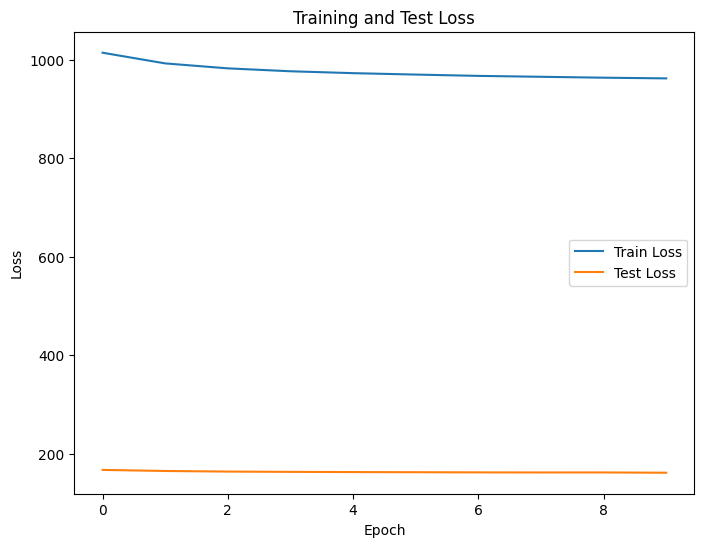

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss')
plt.show()

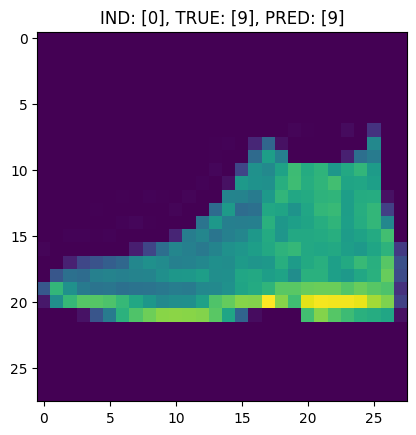

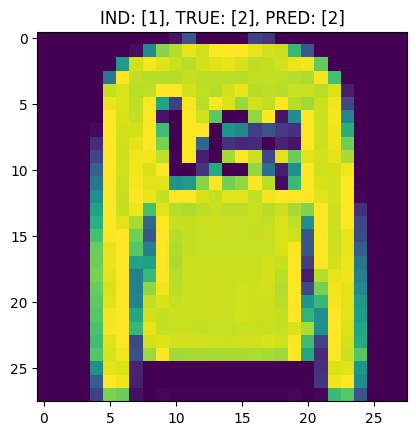

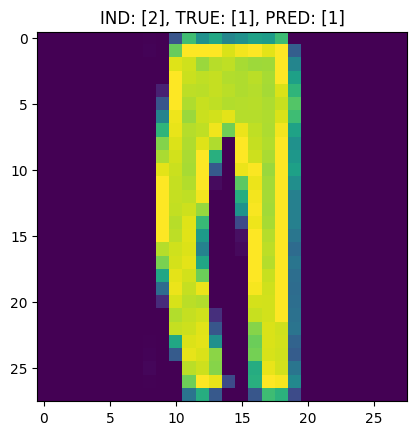

In [ ]:
model.eval()

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)
        inputs = inputs.reshape(-1, 28*28).to(device)

        outputs = model(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred) in enumerate(zip(inputs, targets, predictions_indices)):
            plt.title(f"IND: [{i}], TRUE: [{trgt}], PRED: [{pred}]")
            plt.imshow(inpt.cpu().view(28, 28).numpy())
            plt.show()
            if i==2:
                break
        break

In [ ]:
model.eval()

true = torch.empty(0, device='cuda:0')
predict = torch.empty(0, device='cuda:0')

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to('cuda:0')
        inputs = inputs.reshape(-1, 28*28).to(device)

        outputs = model(inputs)
        outputs = outputs.to('cuda:0')
        _, predictions_indices = torch.max(outputs, 1)
        predictions_indices = predictions_indices.to('cuda:0')
        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))



<Axes: >

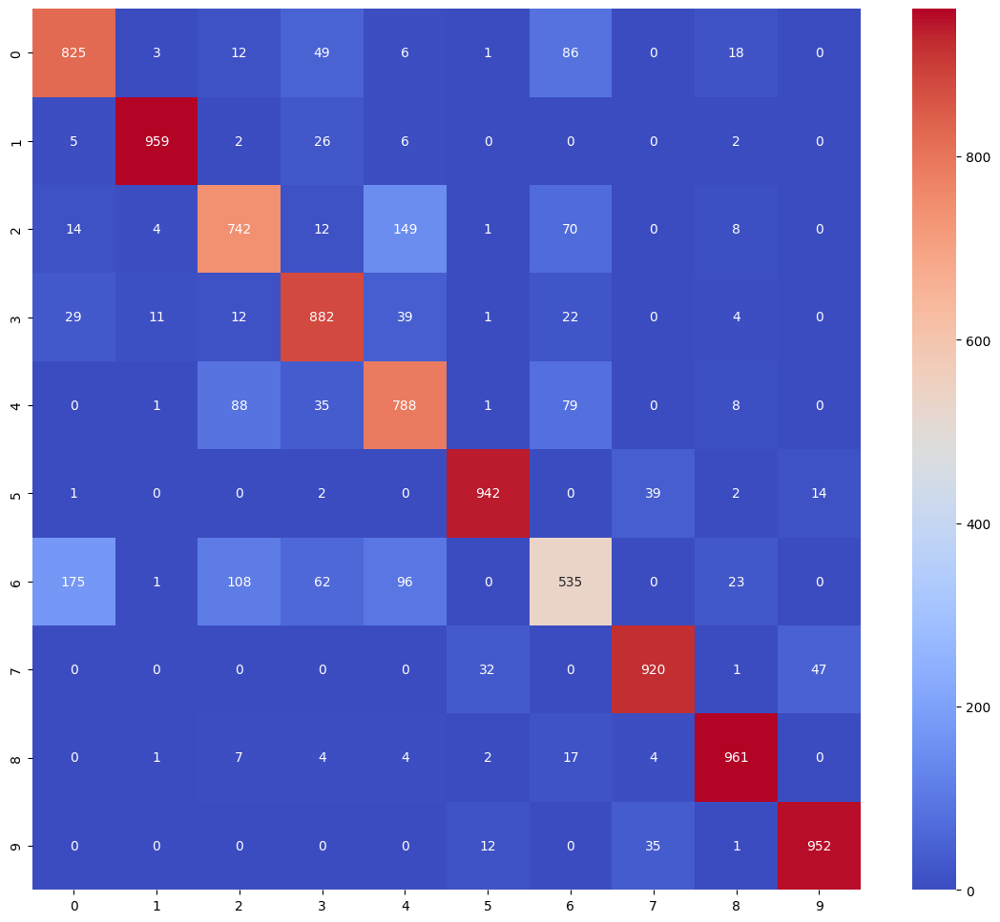

In [ ]:
plt.figure(figsize=(14,12))
true_cpu = true.cpu().numpy().astype("int")
predict_cpu = predict.cpu().numpy().astype("int")

sns.heatmap(
    pd.DataFrame(confusion_matrix(true_cpu, predict_cpu)),
    annot=True,
    fmt="d",
    cmap="coolwarm"
)


In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.8506


In [ ]:
torch.save(model.state_dict(), 'model_1_1_fashion_mnist.pth')

### 1.2 Решить задачу 1.1, используя сверточную нейронную сеть.
* Добиться значения accuracy на тестовом множестве не менее 90%
* Визуализировать результаты работы первого сверточного слоя

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(
                in_channels=1,
                out_channels=32,
                kernel_size=3,
                padding=1,
            ),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2,
                stride=2,
            ),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(
                in_channels=32,
                out_channels=64,
                kernel_size=3
            ),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )

        self.fc1 = nn.Sequential(
            nn.Linear(in_features=2304, out_features=600),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(in_features=600, out_features=120),
            nn.Linear(in_features=120, out_features=10),
            nn.LogSoftmax(dim=1),
        )


    def forward(self, x):
        x = self.conv1(x) # первый сверточный слой
        x = self.conv2(x) # второй сверточный слой
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

    def forward_1l(self, x):
        x = self.conv1(x) # первый сверточный слой
        return x

In [ ]:
learning_rate = 0.001
num_epochs = 20
model = Net().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)
criterion = nn.CrossEntropyLoss()

In [ ]:
param_num = sum(p.numel() for p in model.parameters())
print("Количество параметров:", param_num)

Количество параметров: 1475338


In [ ]:
losses = []
test_losses = []
for epoch in range(num_epochs):
    total_loss, train_accuracy = train(model, device, train_dl, optimizer, criterion, squeeze_inputs=False)
    losses.append(total_loss)
    test_loss, test_accuracy = test(model, device, test_dl, criterion, squeeze_inputs=False)
    test_losses.append(test_loss)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}], Test_loss: [{test_loss:.4f}]")
    if test_accuracy >= 0.905:
        break

epoch [1]: Loss: [268.8702], Train_acc: [0.8373], Test_acc: [0.8842], Test_loss: [31.5153]
epoch [2]: Loss: [189.0426], Train_acc: [0.8853], Test_acc: [0.8942], Test_loss: [29.1169]
epoch [3]: Loss: [161.4945], Train_acc: [0.9036], Test_acc: [0.9091], Test_loss: [25.1263]


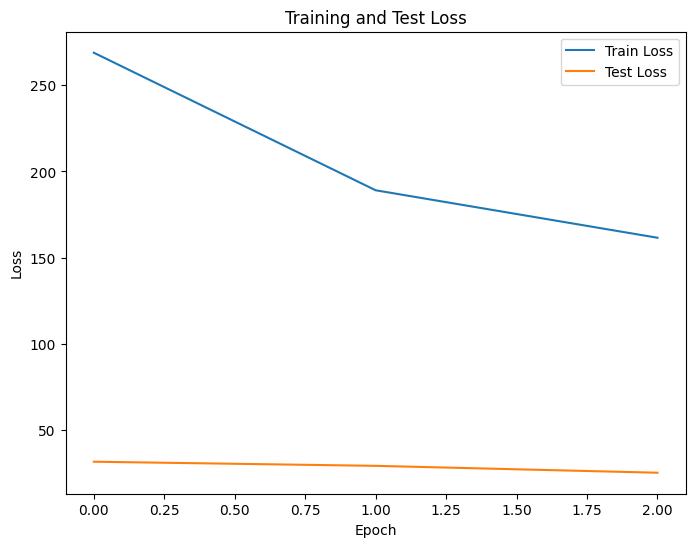

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss')
plt.show()

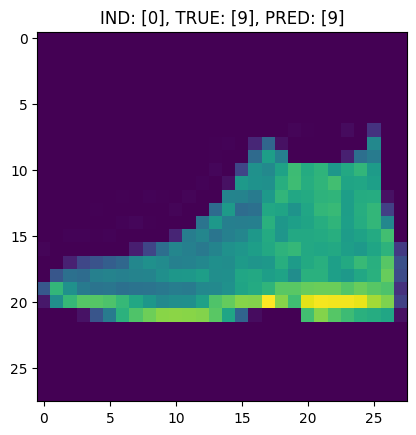

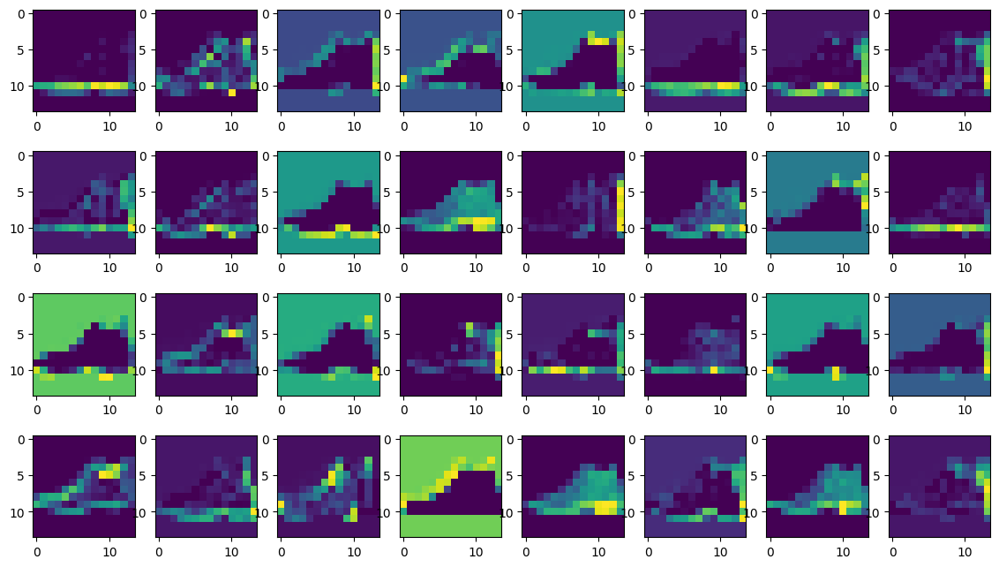

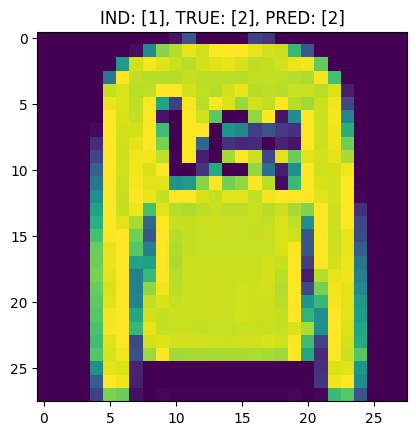

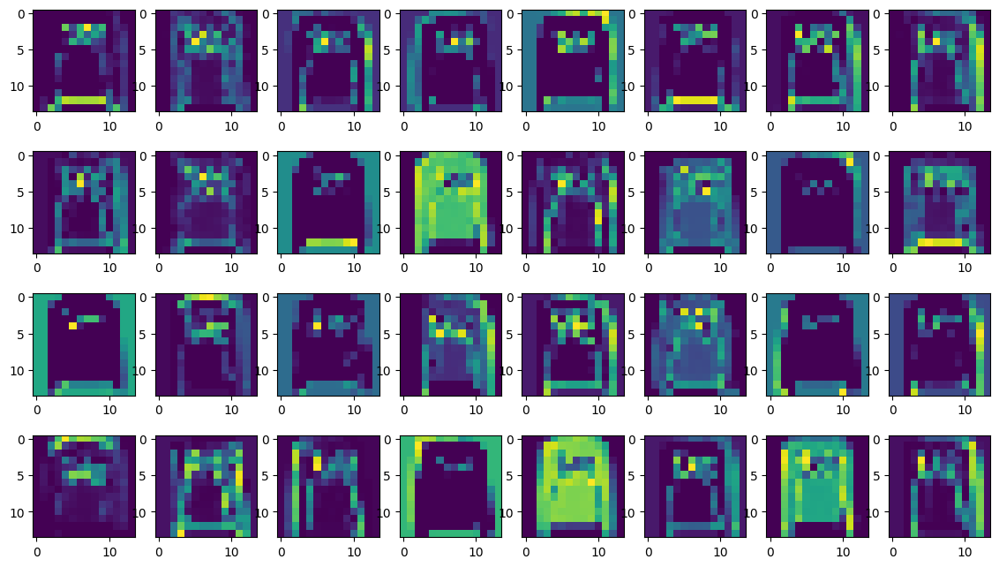

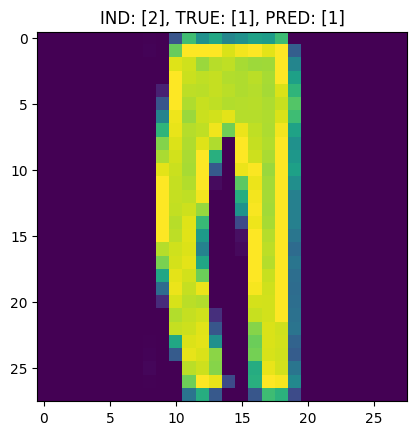

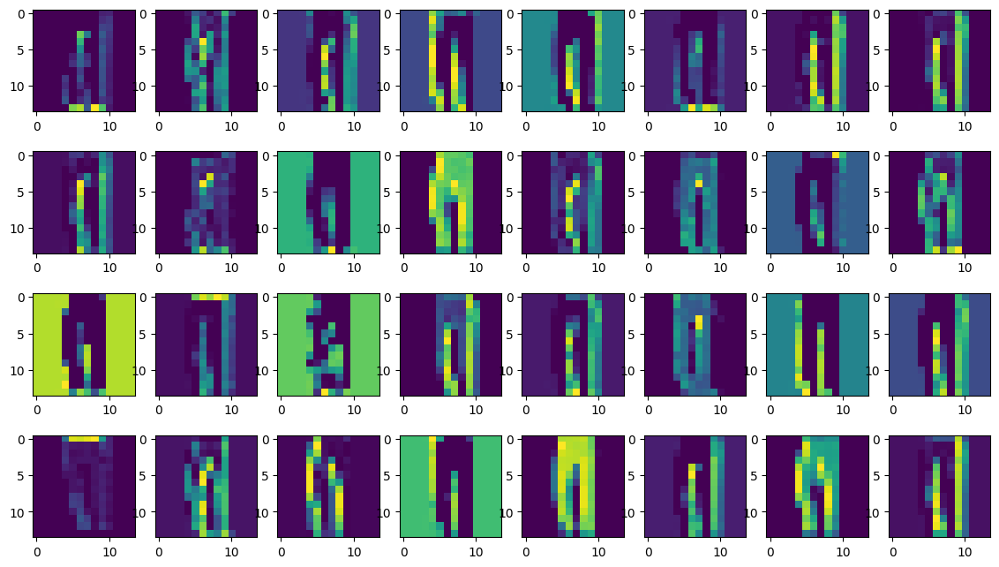

In [ ]:
model.eval()

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad()
        outputs = model.forward(inputs)
        outputs_1l = model.forward_1l(inputs)
        loss = criterion(outputs, targets)
        #loss.backward()
        optimizer.step()
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs, targets, predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{trgt}], PRED: [{pred}]")
            plt.imshow(inpt.cpu().view(28, 28).numpy())
            fig, ax = plt.subplots(4,8, figsize=(14, 8))

            j = 0
            for axi in ax:
                for axj in axi:
                    out_1l_cpu = out_1l[j].cpu().numpy()
                    axj.imshow(out_1l_cpu)

                    j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
model.eval()

true = torch.empty(0, device='cuda:0')
predict = torch.empty(0, device='cuda:0')

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))


<Axes: >

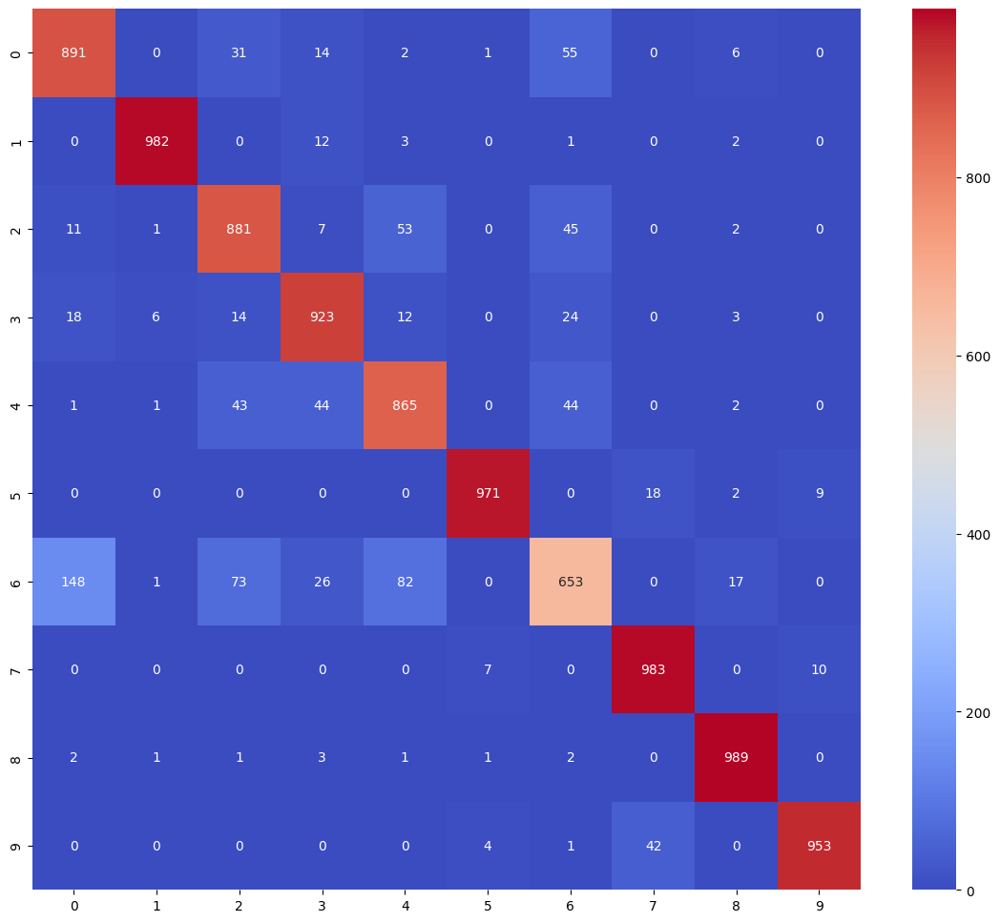

In [ ]:
plt.figure(figsize=(14,12))
true_cpu = true.cpu().numpy().astype("int")
predict_cpu = predict.cpu().numpy().astype("int")

sns.heatmap(
    pd.DataFrame(confusion_matrix(true_cpu, predict_cpu)),
    annot=True,
    fmt="d",
    cmap="coolwarm"
)

In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.9091


##  2. Классификация изображений (датасет CIFAR 10)

In [ ]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

batch_size = 4

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

100%|██████████| 170498071/170498071 [00:02<00:00, 81101554.35it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified



### 2.1 Решить задачу классификации, не используя сверточные слои.

* Нормализовать данные (если необходимо)
* Предложить архитектуру модели для решения задачи
* Посчитать количество параметров модели.
* Обучить модель
* Вывести график функции потерь по эпохам.
* Используя тестовое множество

  * Продемонстрировать работу модели: вывести несколько изображений, указать над ними правильный класс и класс, предсказанный моделью.

  * Вывести матрицу ошибок.

  * Вывести значение accuracy на тестовом множестве.
* Сохранить модель

In [ ]:
im_size = 32 * 32 * 3
\

class CIFARNet(nn.Module):
    def __init__(self):
        super(CIFARNet, self).__init__()
        self.fc1 = nn.Linear(im_size, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, 128)
        self.fc4 = nn.Linear(128, 64)
        self.fc5 = nn.Linear(64, 10)

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = nn.functional.relu(self.fc1(x))
        x = nn.functional.relu(self.fc2(x))
        x = nn.functional.relu(self.fc3(x))
        x = nn.functional.relu(self.fc4(x))
        x = self.fc5(x)
        return x



In [ ]:
cifar_net = CIFARNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cifar_net.parameters(), lr=0.0001, weight_decay=1e-5)

In [ ]:
param_num = sum(p.numel() for p in cifar_net.parameters())
print("Количество параметров:", param_num)

Количество параметров: 1746506


In [ ]:
losses = []
test_losses = []
for epoch in range(15):
    total_loss, train_accuracy = train(cifar_net, device, trainloader, optimizer, criterion, squeeze_inputs=False)
    losses.append(total_loss)
    test_loss, test_accuracy = test(cifar_net, device, testloader, criterion, squeeze_inputs=False)
    test_losses.append(test_loss)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}], Test_loss: [{test_loss:.4f}]")


epoch [1]: Loss: [20837.4393], Train_acc: [0.4061], Test_acc: [0.4712], Test_loss: [3762.6306]
epoch [2]: Loss: [17911.4147], Train_acc: [0.4933], Test_acc: [0.5017], Test_loss: [3527.0943]
epoch [3]: Loss: [16406.0961], Train_acc: [0.5363], Test_acc: [0.5295], Test_loss: [3352.2645]
epoch [4]: Loss: [15211.8243], Train_acc: [0.5718], Test_acc: [0.5377], Test_loss: [3318.2591]
epoch [5]: Loss: [14113.6470], Train_acc: [0.6024], Test_acc: [0.5361], Test_loss: [3336.0116]
epoch [6]: Loss: [13142.8574], Train_acc: [0.6286], Test_acc: [0.5382], Test_loss: [3266.3296]
epoch [7]: Loss: [12151.3447], Train_acc: [0.6553], Test_acc: [0.5474], Test_loss: [3314.8625]
epoch [8]: Loss: [11233.4098], Train_acc: [0.6813], Test_acc: [0.5466], Test_loss: [3360.6885]
epoch [9]: Loss: [10345.9447], Train_acc: [0.7070], Test_acc: [0.5522], Test_loss: [3507.6912]
epoch [10]: Loss: [9459.2132], Train_acc: [0.7327], Test_acc: [0.5594], Test_loss: [3528.6407]
epoch [11]: Loss: [8634.6010], Train_acc: [0.7547]

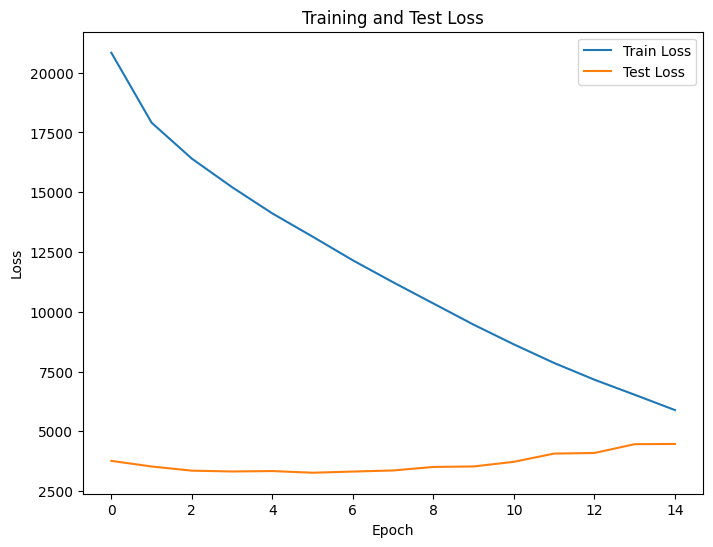

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss')
plt.show()

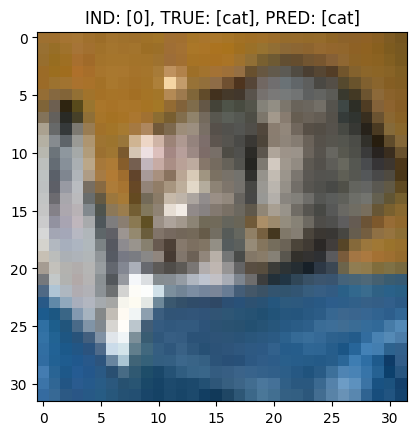

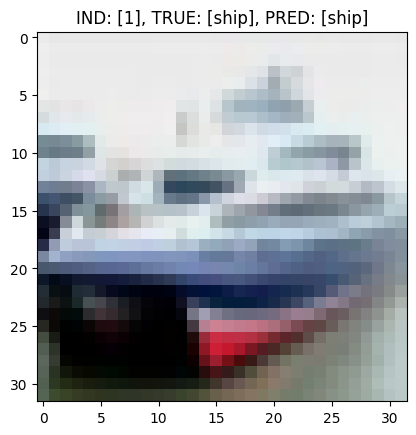

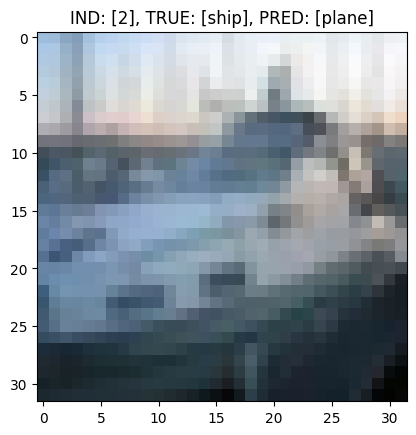

In [ ]:
cifar_net.eval()

with torch.no_grad():
    for inputs, targets in testloader:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = cifar_net(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred) in enumerate(zip(inputs, targets, predictions_indices)):
            plt.title(f"IND: [{i}], TRUE: [{classes[trgt]}], PRED: [{classes[pred]}]")


            inpt_cpu = inpt.to('cpu')

            inpt_numpy = (inpt_cpu / 2 + 0.5).numpy()

            plt.imshow(np.transpose(inpt_numpy, (1, 2, 0)))
            plt.show()

            if i==2:
                break
        break

In [ ]:
cifar_net.eval()

true = torch.empty(0).to(device)
predict = torch.empty(0).to(device)

with torch.no_grad():
    for inputs, targets in testloader:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = cifar_net(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))


<Axes: >

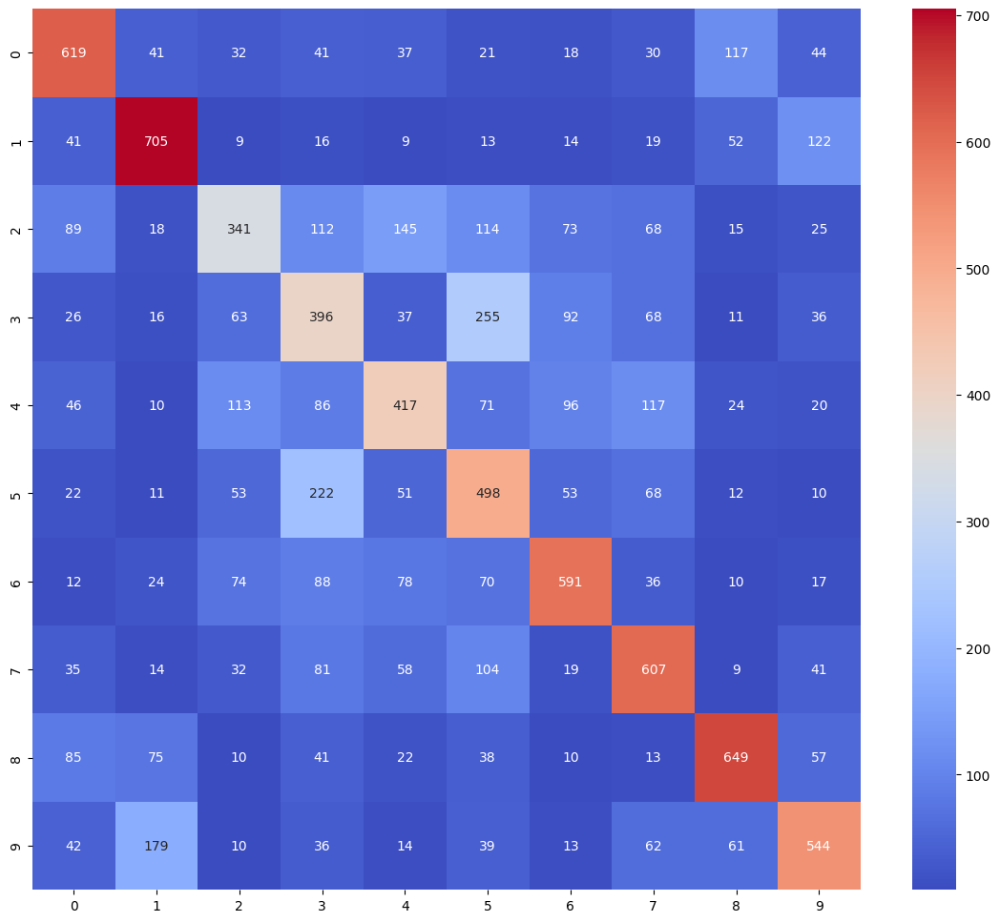

In [ ]:


plt.figure(figsize=(14,12))
true_cpu = true.cpu().numpy().astype("int")
predict_cpu = predict.cpu().numpy().astype("int")

sns.heatmap(
    pd.DataFrame(confusion_matrix(true_cpu, predict_cpu)),
    annot=True,
    fmt="d",
    cmap="coolwarm"
)


In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.5367


In [ ]:
torch.save(cifar_net.state_dict(), 'model_2_1_cifar10.pth')

### 2.2 Решить задачу 2.1, используя сверточную нейронную сеть.
* Добиться значения accuracy на тестовом множестве не менее 70%.
* Визуализировать результаты работы первого сверточного слоя

In [ ]:


class CIFARNet2(nn.Module):
    def __init__(self):
        super(CIFARNet2, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(
                in_channels=3,
                out_channels=16,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Conv2d(
                in_channels=16,
                out_channels=32,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2,
                stride=2,
            ),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(
                in_channels=32,
                out_channels=64,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2,
                stride=2
            )
        )



        self.fc1 = nn.Sequential(
            nn.Linear(in_features=64*8*8, out_features=600),
            nn.Dropout(p=0.25),
            nn.Linear(in_features=600, out_features=120),
            nn.Linear(in_features=120, out_features=10),
        )

    def forward(self, x):
        x = self.conv1(x) # первый сверточный слой
        x = self.conv2(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x


In [ ]:
cifar_net2 = CIFARNet2().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cifar_net2.parameters(), lr=0.0005, weight_decay=1e-5)

In [ ]:
param_num = sum(p.numel() for p in cifar_net2.parameters())
print("Количество параметров:", param_num)

In [ ]:
losses = []
test_losses = []
for epoch in range(10):
    total_loss, train_accuracy = train(cifar_net2, device, trainloader, optimizer, criterion, squeeze_inputs=False)
    losses.append(total_loss)
    test_loss, test_accuracy = test(cifar_net2, device, testloader, criterion, squeeze_inputs=False)
    test_losses.append(test_loss)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}], Test_loss: [{test_loss:.4f}]")


epoch [1]: Loss: [17798.0085], Train_acc: [0.4915], Test_acc: [0.6352], Test_loss: [2576.7737]
epoch [2]: Loss: [12495.1402], Train_acc: [0.6519], Test_acc: [0.6733], Test_loss: [2336.9568]
epoch [3]: Loss: [10712.2634], Train_acc: [0.7036], Test_acc: [0.7141], Test_loss: [2122.3920]
epoch [4]: Loss: [9654.0139], Train_acc: [0.7326], Test_acc: [0.7139], Test_loss: [2066.1154]
epoch [5]: Loss: [8874.8161], Train_acc: [0.7562], Test_acc: [0.7072], Test_loss: [2206.6976]
epoch [6]: Loss: [8185.5499], Train_acc: [0.7738], Test_acc: [0.7305], Test_loss: [2040.5590]
epoch [7]: Loss: [7706.2169], Train_acc: [0.7867], Test_acc: [0.7246], Test_loss: [2074.3302]
epoch [8]: Loss: [7251.9809], Train_acc: [0.7981], Test_acc: [0.7153], Test_loss: [2161.0430]
epoch [9]: Loss: [6861.2170], Train_acc: [0.8101], Test_acc: [0.7205], Test_loss: [2212.8619]
epoch [10]: Loss: [6543.5605], Train_acc: [0.8185], Test_acc: [0.7278], Test_loss: [2127.1940]


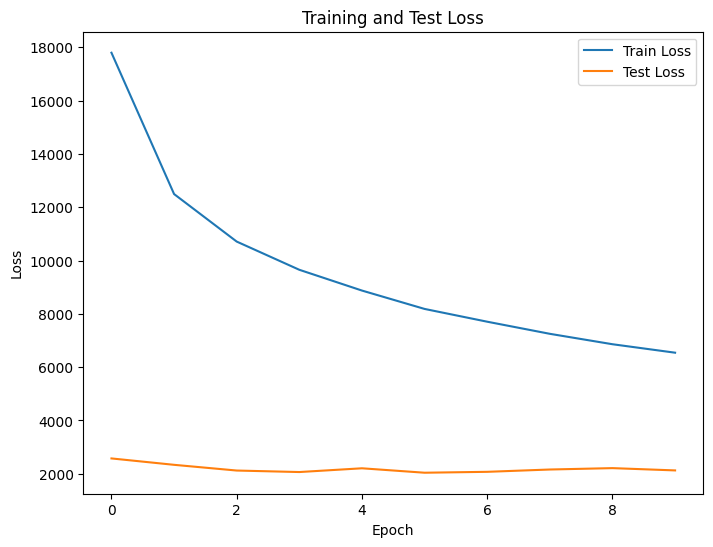

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss')
plt.show()

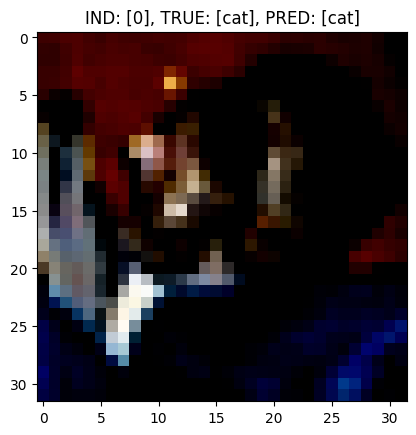

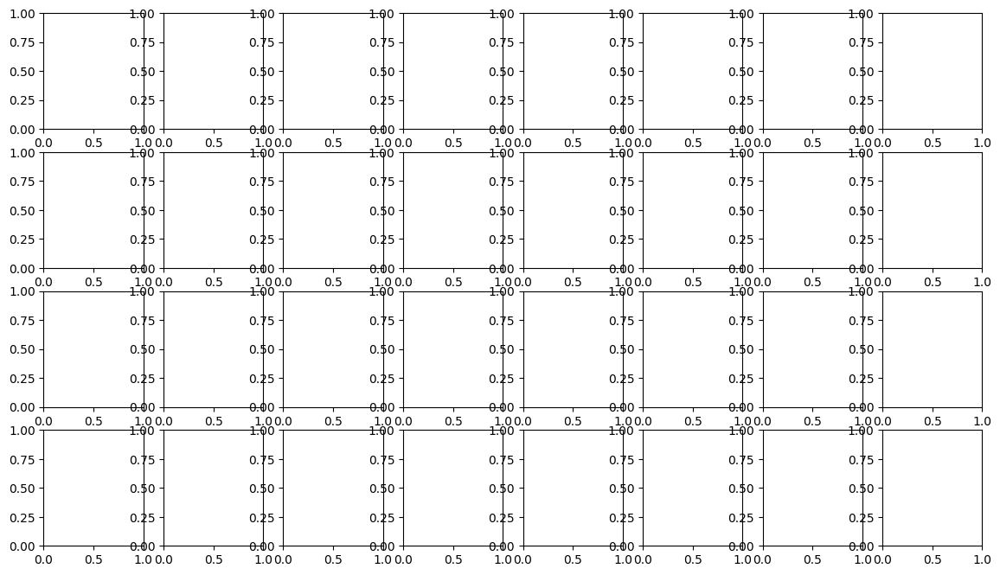

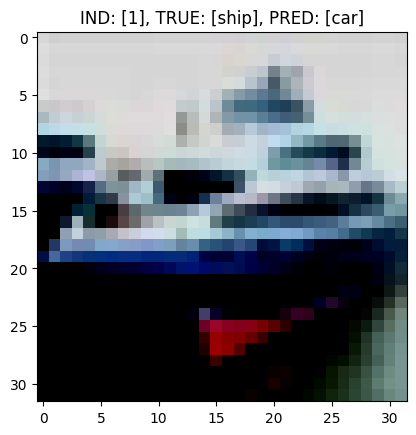

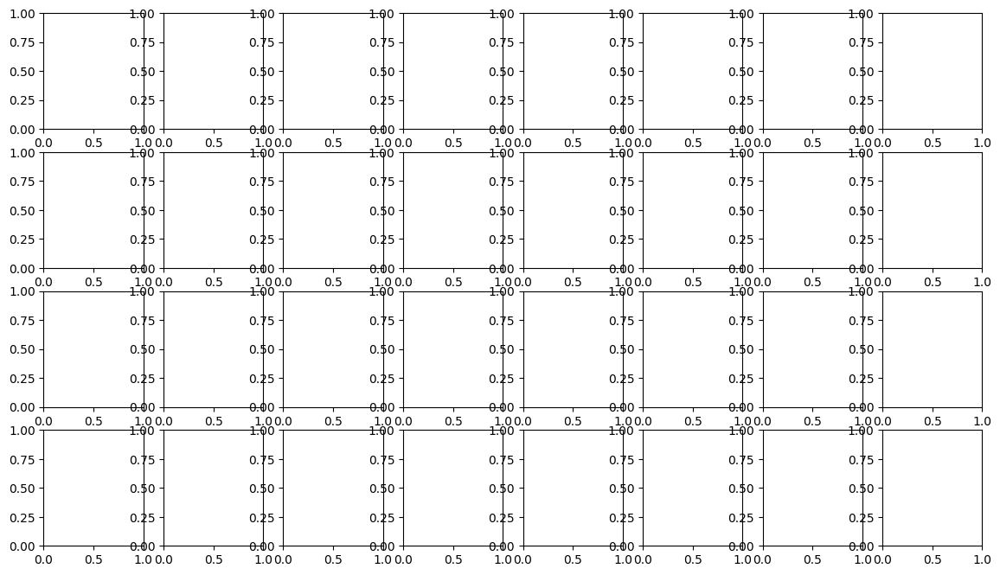

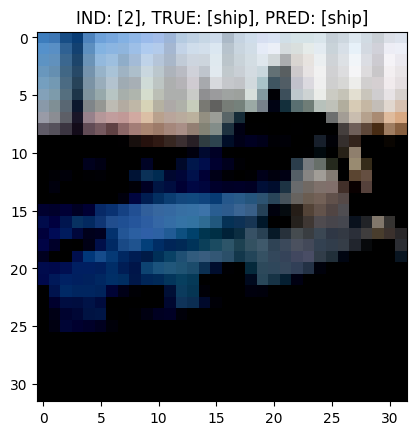

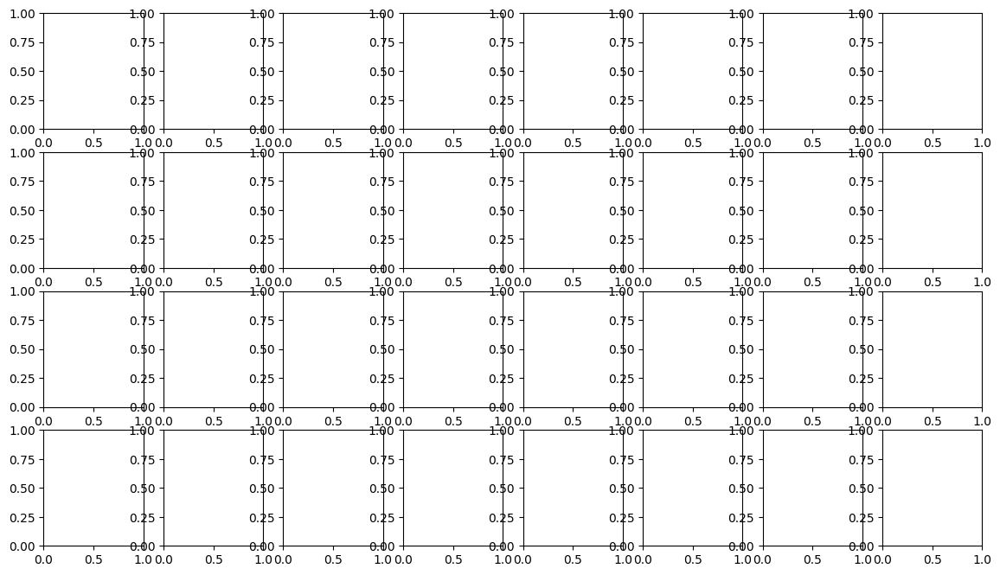

In [ ]:
cifar_net2.eval()

with torch.no_grad():
    for inputs, targets in testloader:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = cifar_net2.forward(inputs)
        #outputs_1l = cifar_net2.forward_1l(inputs)
        _, predictions_indices = torch.max(outputs, 1)


        for i, (inpt, trgt, pred) in enumerate(zip(inputs, targets, predictions_indices)):
            plt.title(f"IND: [{i}], TRUE: [{classes[trgt]}], PRED: [{classes[pred]}]")
            inpt_cpu = inpt.to('cpu')
            inpt_numpy = inpt_cpu.cpu().numpy()

            plt.imshow(np.transpose(inpt_numpy, (1, 2, 0)))
            fig, ax = plt.subplots(4,8, figsize=(14, 8))

            j = 0
            for axi in ax:
                for axj in axi:
                    out_1l_cpu = out_1l.to('cpu')

                    curr = (out_1l_cpu / 2 + 0.5).numpy()
                    #axj.imshow(curr)
                    j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
cifar_net2.eval()

true = torch.empty(0).to(device)
predict = torch.empty(0).to(device)

with torch.no_grad():
    for inputs, targets in testloader:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = cifar_net2(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))

<Axes: >

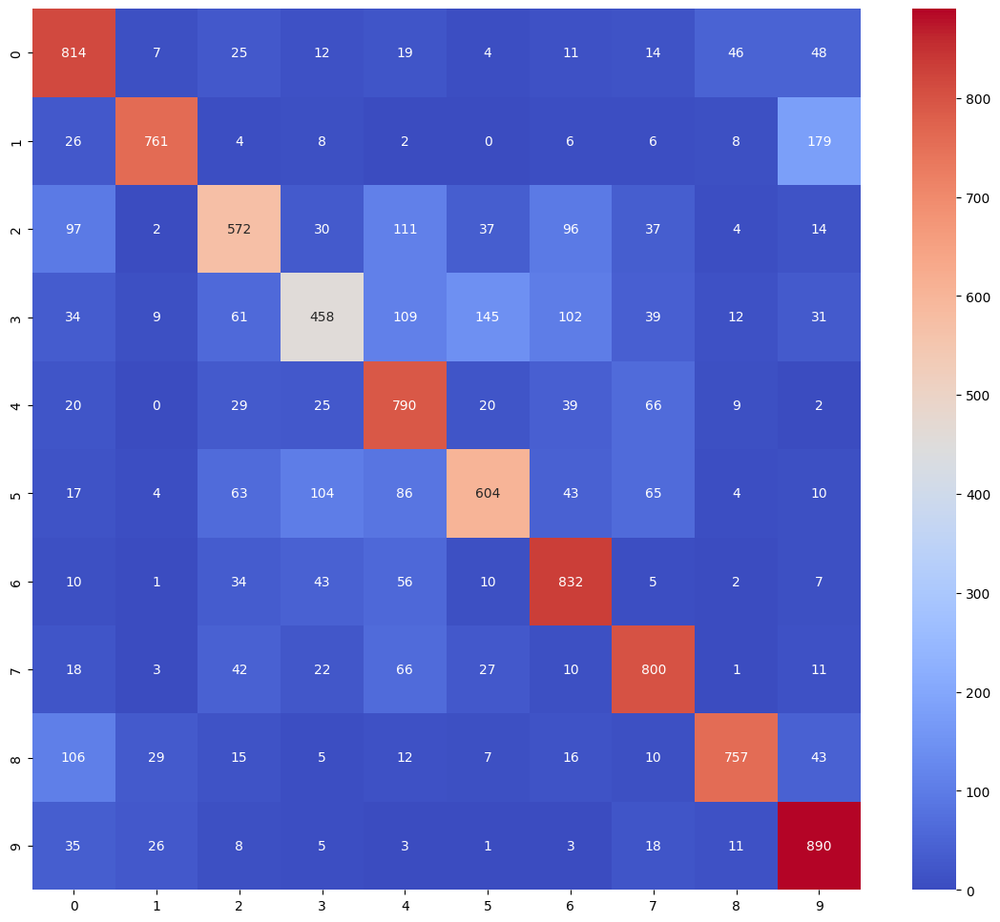

In [ ]:


plt.figure(figsize=(14,12))
true_cpu = true.cpu().numpy().astype("int")
predict_cpu = predict.cpu().numpy().astype("int")

sns.heatmap(
    pd.DataFrame(confusion_matrix(true_cpu, predict_cpu)),
    annot=True,
    fmt="d",
    cmap='coolwarm'
)


In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.7278


In [ ]:
torch.save(cifar_net2.state_dict(), 'model_2_2_cifar10.pth')

## 3. Загрузка изображений из внешних источников

### 3.1 Решить задачу классификации обезьян (датасет [monkey.zip](https://disk.yandex.ru/d/OxYgY4S7aR6ulQ)).
* Загрузить архив с данными на диск
* Создать датасет на основе файлов при помощи `torchvision.datasets.ImageFolder`
* Преобразовать изображения к тензорами одного размера (например, 400х400). Потестировать другие преобразования из `torchvision.transforms`
* Предложить архитектуру модели для решения задачи. Обучить модель.
* Используя тестовое множество

  * Продемонстрировать работу модели: вывести несколько изображений, указать над ними правильный класс и класс, предсказанный моделью.

  * Вывести матрицу ошибок.

  * Вывести значение accuracy на тестовом множестве.
  * Добиться значения accuracy на тестовом множестве не менее 60%

In [ ]:
!unzip /content/monkeys.zip -d /content/monkeys.zip
from google.colab import files
uploaded = files.upload()



Archive:  /content/monkeys.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/monkeys.zip or
        /content/monkeys.zip.zip, and cannot find /content/monkeys.zip.ZIP, period.


Saving monkeys.zip to monkeys (1).zip


In [ ]:
import zipfile
with zipfile.ZipFile('monkeys (1).zip', 'r') as zip_ref:
    zip_ref.extractall('/content/monkeys')


In [ ]:
train_dl = torch.utils.data.DataLoader(
    datasets.ImageFolder('./monkeys/training/training',
        transform=transforms.Compose([
            transforms.Resize((100, 100)),
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
        ])),
    batch_size=32, shuffle=True)
test_dl = torch.utils.data.DataLoader(
    datasets.ImageFolder('./monkeys/validation/validation',
        transform=transforms.Compose([
            transforms.Resize((100, 100)),
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
        ])),
    batch_size=32, shuffle=False)


In [ ]:

class MonkeyNet(nn.Module):
    def __init__(self):
        super(MonkeyNet, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(
                in_channels=3,
                out_channels=32,
                kernel_size=5,
                padding=1,
            ),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(
                in_channels=32,
                out_channels=64,
                kernel_size=5,
                padding=1,
            ),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(
                in_channels=64,
                out_channels=128,
                kernel_size=5,
                padding=1,
            ),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )

        self.fc1 = nn.Sequential(
            nn.Dropout(p=0.5),
            nn.Linear(in_features=128*10*10, out_features=1200),
            nn.ReLU(),
            nn.Linear(1200, 512),
            nn.ReLU(),
            nn.Linear(512, 10),

        )


    def forward(self, x):
        x = self.conv1(x) # первый сверточный слой
        x = self.conv2(x)
        x = self.conv3(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

    def forward_1l(self, x):
        x = self.conv1(x) # первый сверточный слой
        return x

In [ ]:
monkey_net = MonkeyNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(monkey_net.parameters(), lr=0.0001)

In [ ]:
param_num = sum(p.numel() for p in monkey_net.parameters())
print("Количество параметров:", param_num)

Количество параметров: 22998266


In [ ]:
losses = []
test_losses = []
for epoch in range(10):
    total_loss, train_accuracy = train(monkey_net, device, train_dl, optimizer, criterion)
    losses.append(total_loss)
    test_loss, test_accuracy = test(monkey_net, device, test_dl, criterion)
    test_losses.append(test_loss)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}], Test_loss: [{test_loss:.4f}]")
    if test_accuracy >=0.65:
        break



epoch [1]: Loss: [43.1014], Train_acc: [0.5624], Test_acc: [0.5404], Test_loss: [12.5749]
epoch [2]: Loss: [38.5909], Train_acc: [0.6035], Test_acc: [0.5625], Test_loss: [11.7912]
epoch [3]: Loss: [34.0622], Train_acc: [0.6645], Test_acc: [0.5662], Test_loss: [10.8244]
epoch [4]: Loss: [30.4787], Train_acc: [0.7119], Test_acc: [0.5735], Test_loss: [11.0644]
epoch [5]: Loss: [27.5493], Train_acc: [0.7548], Test_acc: [0.5809], Test_loss: [10.7809]
epoch [6]: Loss: [22.0460], Train_acc: [0.7967], Test_acc: [0.6324], Test_loss: [10.7619]
epoch [7]: Loss: [20.7906], Train_acc: [0.8040], Test_acc: [0.6103], Test_loss: [10.1402]
epoch [8]: Loss: [16.7097], Train_acc: [0.8368], Test_acc: [0.6176], Test_loss: [10.9483]
epoch [9]: Loss: [12.7292], Train_acc: [0.8824], Test_acc: [0.6360], Test_loss: [10.6953]
epoch [10]: Loss: [9.4729], Train_acc: [0.9170], Test_acc: [0.6176], Test_loss: [10.7453]


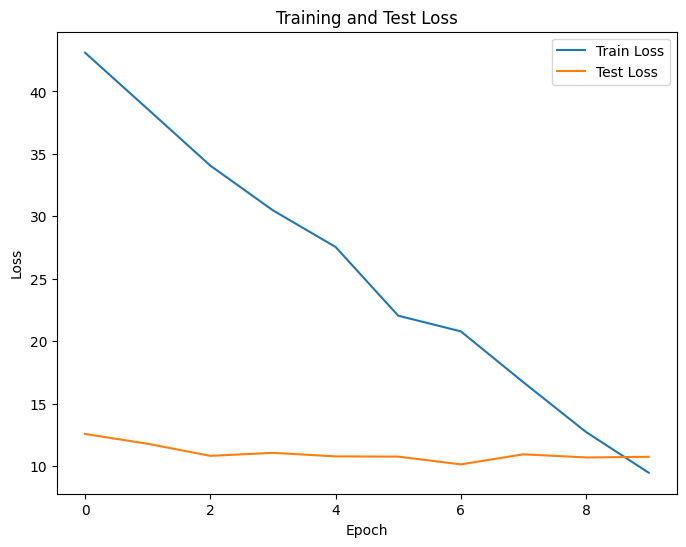

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss')
plt.show()

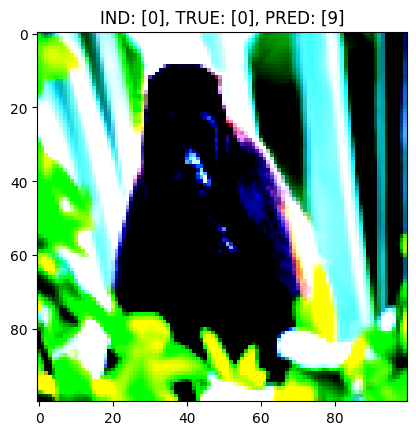

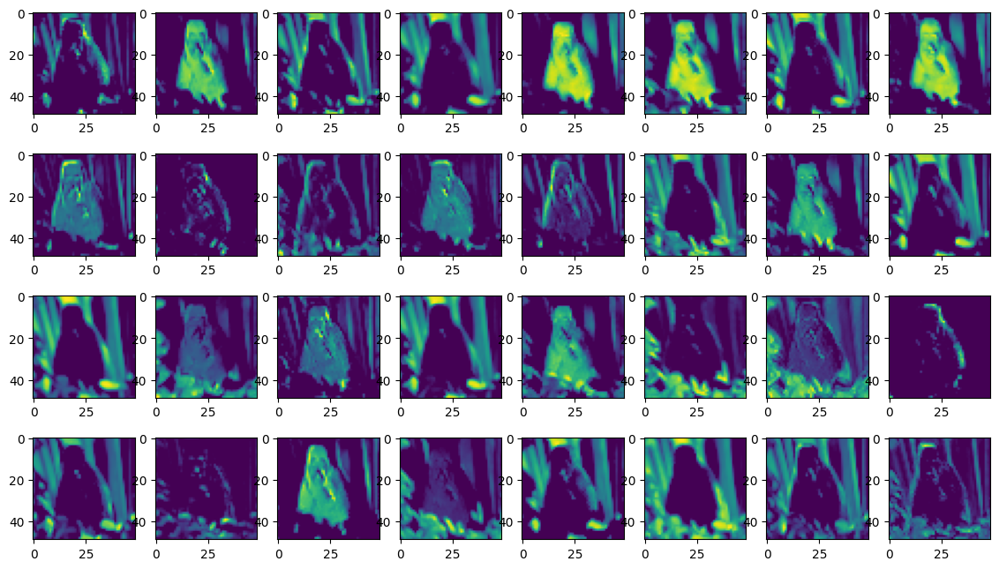

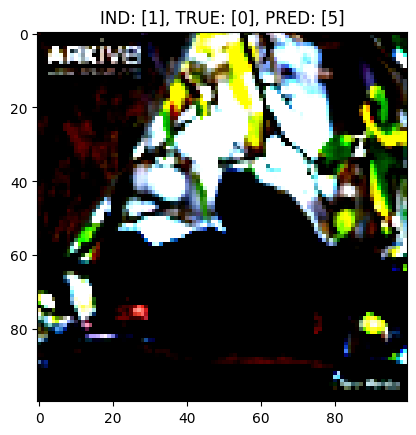

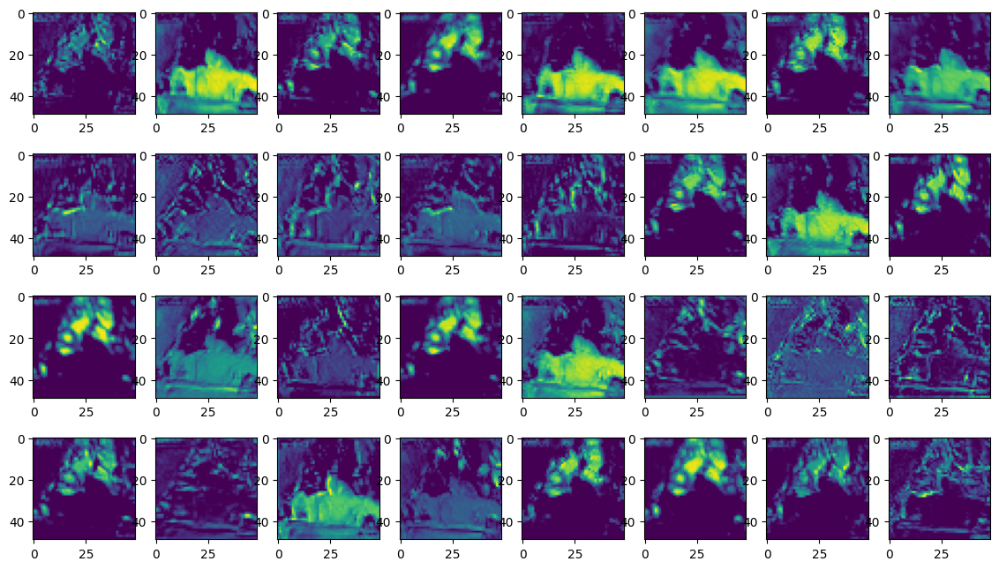

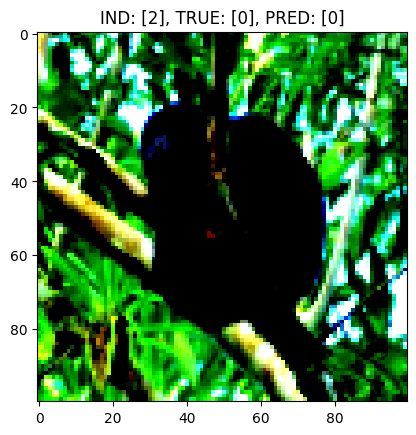

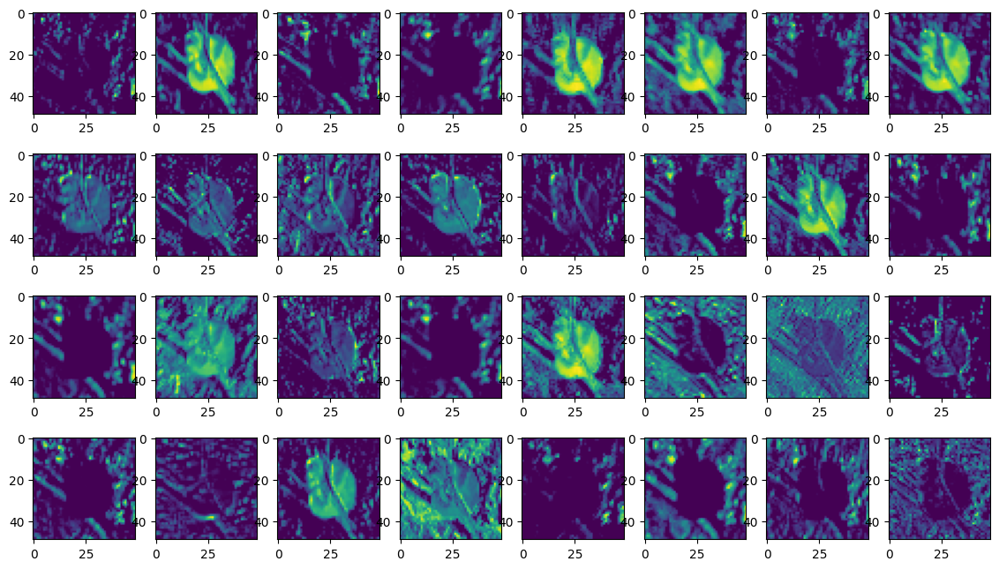

In [ ]:
monkey_net.eval()

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = monkey_net.forward(inputs)
        outputs_1l = monkey_net.forward_1l(inputs)
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs, targets, predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{trgt}], PRED: [{pred}]")
            inpt = inpt.cpu().numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(4,8, figsize=(14, 8))

            j = 0
            for axi in ax:
                for axj in axi:
                    axj.imshow(out_1l[j].cpu().detach().numpy())
                    j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
monkey_net.eval()

true = torch.empty(0).to(device)
predict = torch.empty(0).to(device)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = monkey_net(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))

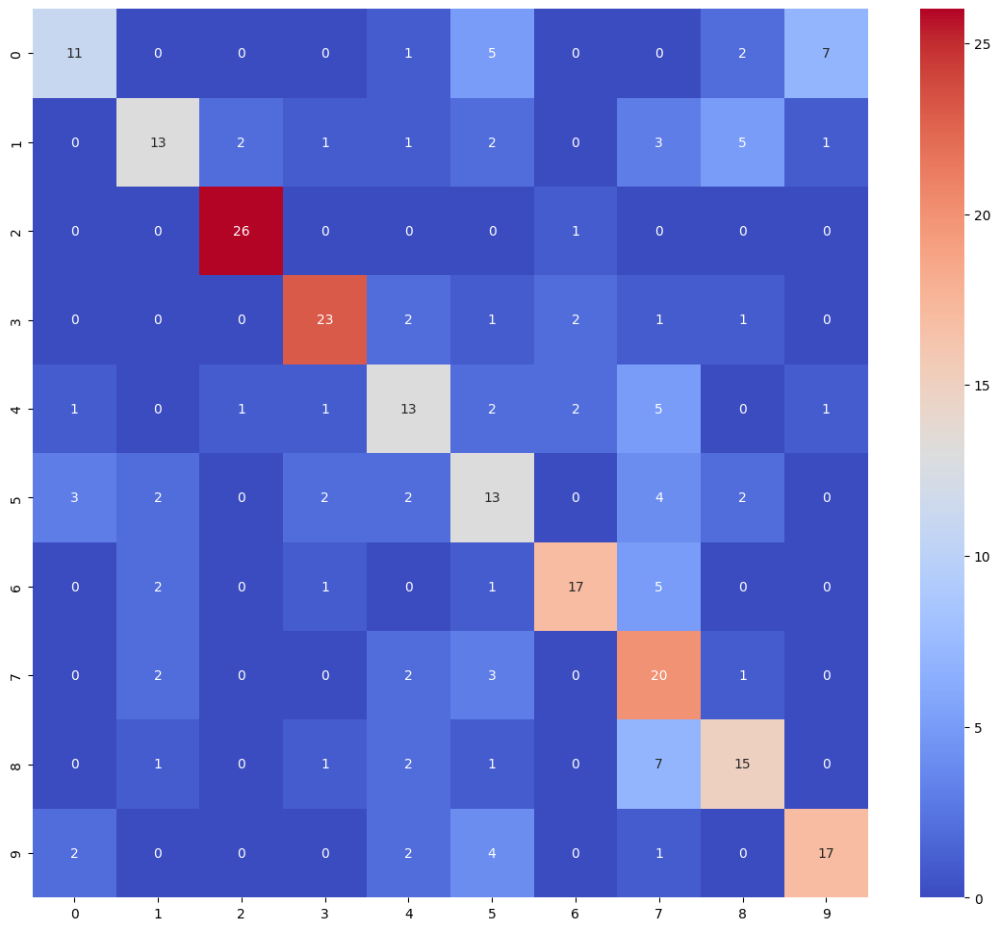

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
         confusion_matrix(true.cpu().numpy().astype("int"), predict.cpu().numpy().astype("int")),
    ),
    annot=True,
    fmt="d",
        cmap='coolwarm'
);

In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.6176


In [ ]:
torch.save(monkey_net.state_dict(), 'model_3_1_monkey.pth')

### 3.2 Решить задачу классификации собак и кошек (датасет [cats_dogs.zip](https://disk.yandex.ru/d/wQtt5O1JF9ctnA)).
* Загрузить архив с данными на диск
* Создать датасет на основе файлов при помощи `torchvision.datasets.ImageFolder`
* Преобразовать изображения к тензорами одного размера (например, 400х400). Потестировать другие преобразования из `torchvision.transforms`
* Предложить архитектуру модели для решения задачи. Обучить модель.
* Используя тестовое множество

  * Продемонстрировать работу модели: вывести несколько изображений, указать над ними правильный класс и класс, предсказанный моделью.

  * Вывести матрицу ошибок.

  * Вывести значение accuracy на тестовом множестве.
  * Добиться значения accuracy на тестовом множестве не менее 80%

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
import zipfile
with zipfile.ZipFile('cat_dogs.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/cat_dogs')


FileNotFoundError: ignored

In [ ]:
dataset =  datasets.ImageFolder(
    './cats_dogs/train',
    transform=transforms.Compose([
        transforms.Resize((64, 64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ])
)
trainx, testx = torch.utils.data.random_split(dataset, [0.8, 0.2])
train_dl = torch.utils.data.DataLoader(
    dataset=trainx,
    batch_size=64, shuffle=True)
test_dl = torch.utils.data.DataLoader(
    dataset=testx,
    batch_size=64, shuffle=False)

In [ ]:

class CatsDogsNet(nn.Module):
    def __init__(self):
        super(CatsDogsNet, self).__init()
        self.conv1 = nn.Sequential(
            nn.Conv2d(
                in_channels=3,
                out_channels=64,
                kernel_size=7,
                padding=3,
                stride=1,
            ),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(
                in_channels=64,
                out_channels=128,
                kernel_size=5,
                padding=2,
                stride=1,
            ),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(
                in_channels=128,
                out_channels=512,
                kernel_size=3,
                padding=1,
                stride=1,
            ),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.fc1 = nn.Sequential(
            nn.Linear(in_features=512, out_features=256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(in_features=256, out_features=2),  # 2 класса (коты и собаки)
            nn.Softmax(dim=1),
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x


In [ ]:
cats_dogs_net = CatsDogsNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(cats_dogs_net.parameters(), lr=0.0001, weight_decay=1e-5)

In [ ]:
param_num = sum(p.numel() for p in cats_dogs_net.parameters())
print("Количество параметров:", param_num)

Количество параметров: 4734978


In [ ]:
losses = []
test_losses = []
for epoch in range(5):
    total_loss, train_accuracy = train(monkey_net, device, train_dl, optimizer, criterion)
    losses.append(total_loss)
    test_loss, test_accuracy = test(monkey_net, device, test_dl, criterion)
    test_losses.append(test_loss)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}], Test_loss: [{test_loss:.4f}]")
    if test_accuracy >=0.85:
        break


epoch [1]: Loss: [443.5990], Train_acc: [0.5464], Test_acc: [0.5920]
epoch [2]: Loss: [409.7157], Train_acc: [0.6109], Test_acc: [0.6748]
epoch [3]: Loss: [353.1260], Train_acc: [0.7055], Test_acc: [0.7112]
epoch [4]: Loss: [305.2039], Train_acc: [0.7626], Test_acc: [0.7906]
epoch [5]: Loss: [263.4402], Train_acc: [0.8072], Test_acc: [0.8242]


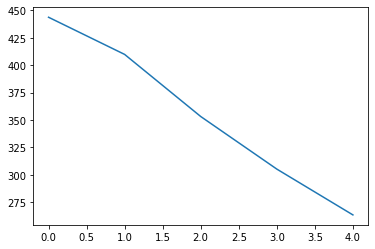

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


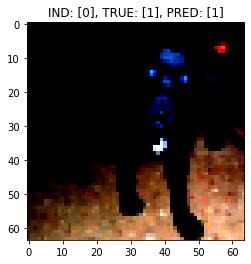

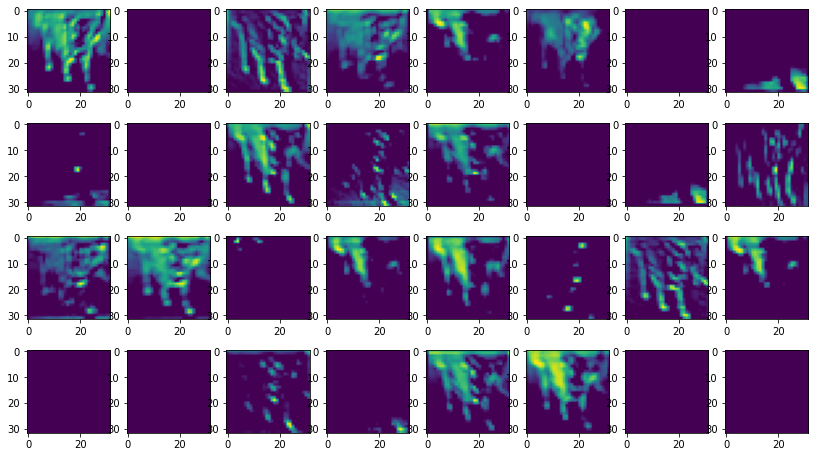

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


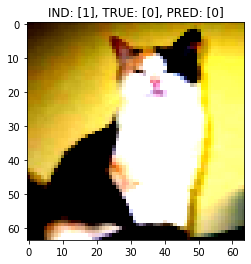

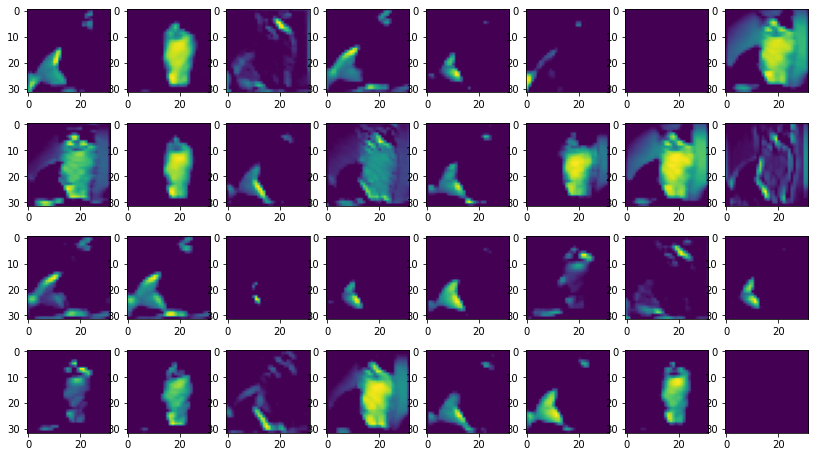

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


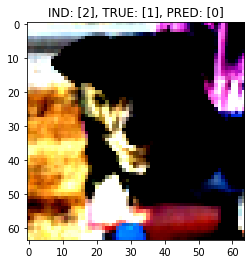

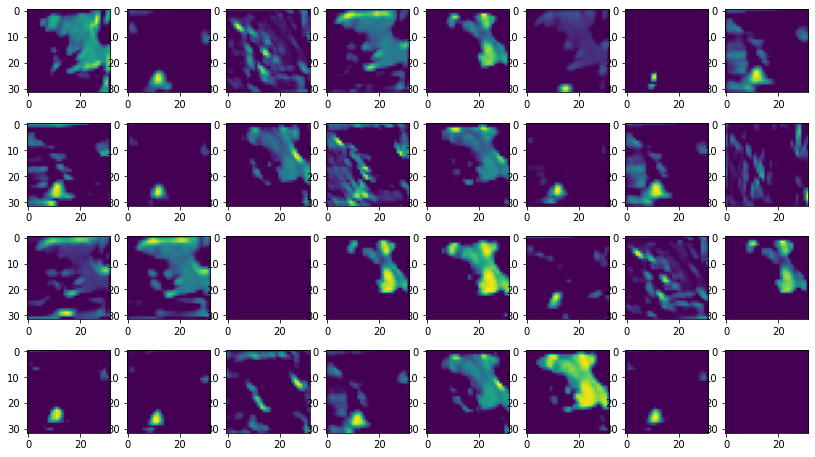

In [ ]:
cats_dogs_net.eval()

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = cats_dogs_net.forward(inputs)
        outputs_1l = cats_dogs_net.forward_1l(inputs)
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs, targets, predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{trgt}], PRED: [{pred}]")
            inpt = inpt.cpu().numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(4,8, figsize=(14, 8))

            j = 0
            for axi in ax:
                for axj in axi:
                  axj.imshow(out_1l[j].cpu().detach().numpy())
                  j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
cats_dogs_net.eval()

true = torch.empty(0).to(device)
predict = torch.empty(0).to(device)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = cats_dogs_net(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))

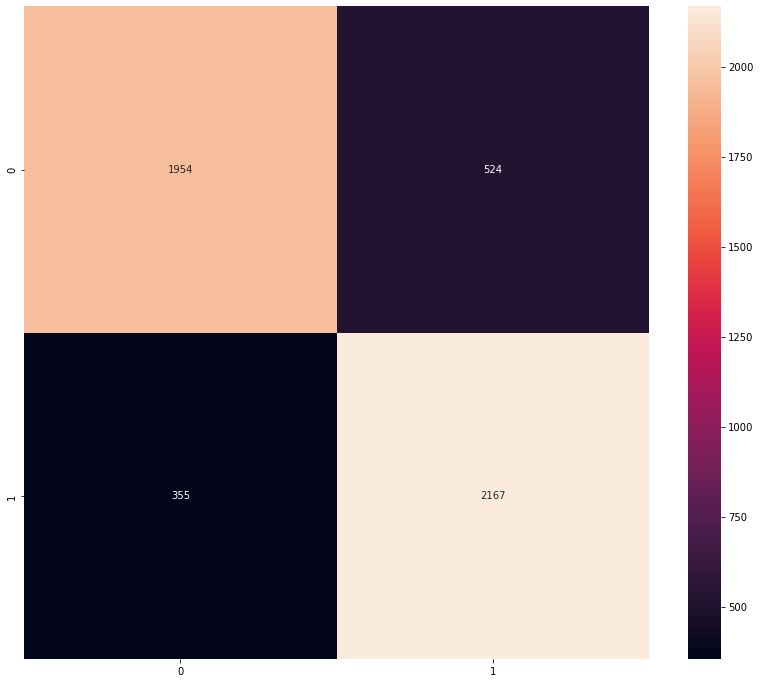

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.cpu().numpy().astype("int"), predict.cpu().numpy().astype("int")),
    ),
    annot=True,
    fmt="d",
    cmap='coolwarm'
)


In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.8242


In [ ]:
torch.save(cats_dogs_net.state_dict(), 'model_3_2_cats_dogs.pth')

# 4. Transfer Learning

### 4.1 Решить задачу 3.1, воспользовавшись предобученной моделью VGG16
* Загрузить данные для обучения
* Преобразования: размер 224x224, нормализация с параметрами `mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)`
* Заменить последний полносвязный слой модели в соответствии с задачей
* Дообучить модель (не замораживать веса). Вычислить значение accuracy на тестовом множестве
* Дообучить модель (заморозить все веса, кроме последнего блока слоев (`classifier`)).
* Вычислить значение accuracy на тестовом множестве.


In [ ]:
transform = transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
            ])

train_dl = torch.utils.data.DataLoader(
    datasets.ImageFolder(
        './monkeys/training/training',
        transform = transform,
    ),
    batch_size=64,
    shuffle=True
)
test_dl = torch.utils.data.DataLoader(
    datasets.ImageFolder(
        './monkeys/validation/validation',
        transform=transform,
    ),
    batch_size=64,
    shuffle=False
)

In [ ]:
vgg16 = models.vgg16(pretrained=True)
num_features = vgg16.classifier[6].in_features
vgg16.classifier[6] = nn.Linear(num_features, 10)

In [ ]:
vgg16 = vgg16.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(vgg16.parameters(), lr=0.0001, weight_decay=1e-5)

In [ ]:
param_num = sum(p.numel() for p in vgg16.parameters())
print("Количество параметров:", param_num)

Количество параметров: 134301514


In [ ]:
losses = []
test_losses = []
for epoch in range(5):
    total_loss, train_accuracy = train(vgg16, device, train_dl, optimizer, criterion)
    losses.append(total_loss)
    test_loss, test_accuracy = test(vgg16, device, test_dl, criterion)
    test_losses.append(test_loss)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}], Test_loss: [{test_loss:.4f}]")


epoch [1]: Loss: [0.1333], Train_acc: [0.9954], Test_acc: [0.9853], Test_loss: [0.1808]
epoch [2]: Loss: [0.2997], Train_acc: [0.9936], Test_acc: [0.9853], Test_loss: [0.2489]
epoch [3]: Loss: [0.5764], Train_acc: [0.9927], Test_acc: [0.9485], Test_loss: [0.8177]
epoch [4]: Loss: [0.3477], Train_acc: [0.9936], Test_acc: [0.9779], Test_loss: [0.3574]
epoch [5]: Loss: [0.0418], Train_acc: [0.9991], Test_acc: [0.9779], Test_loss: [0.3450]


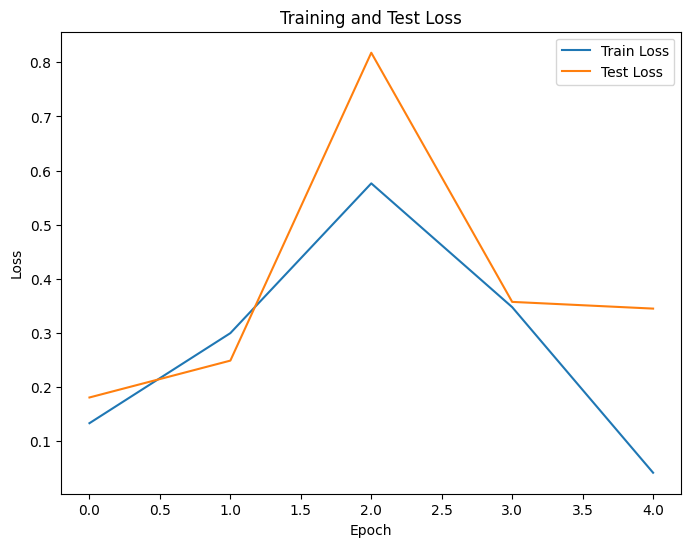

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss')
plt.show()

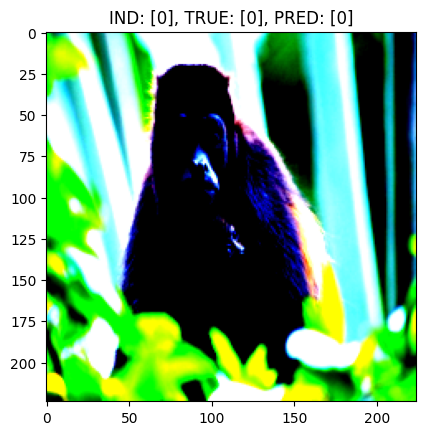

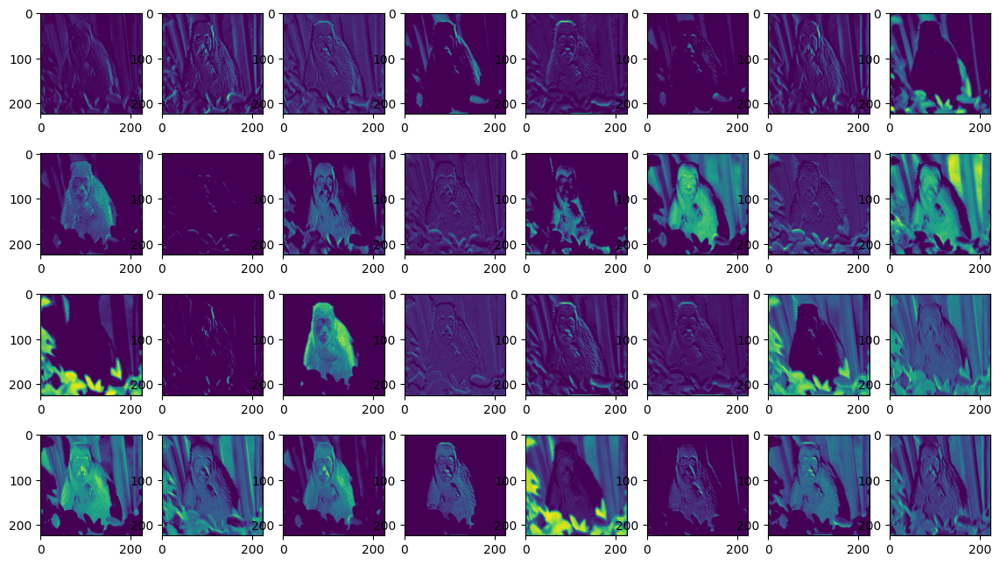

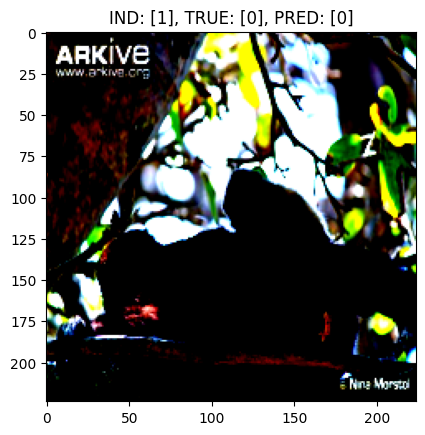

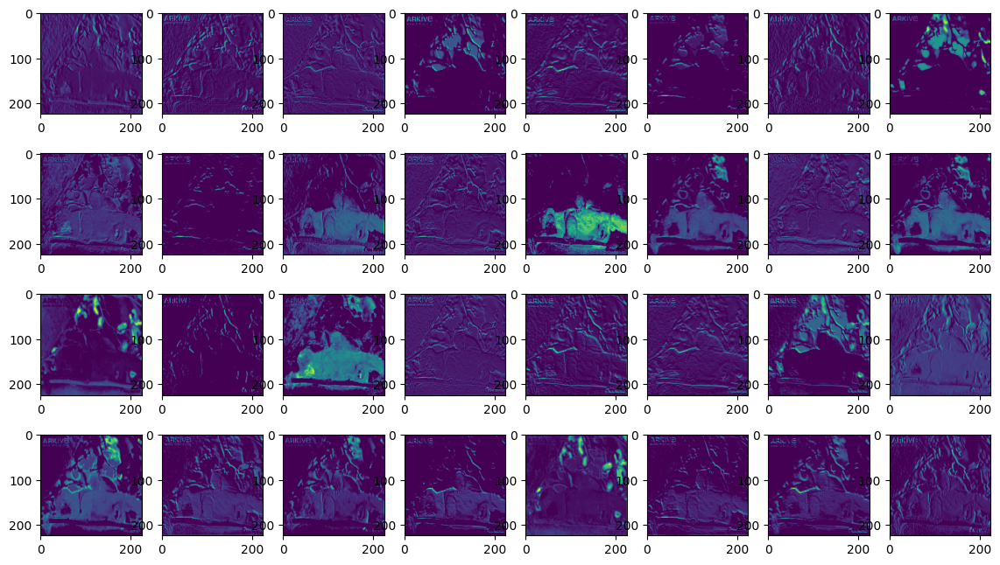

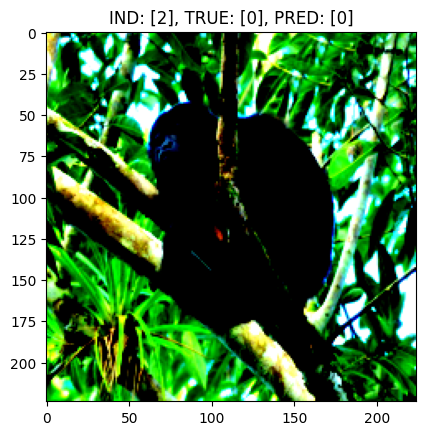

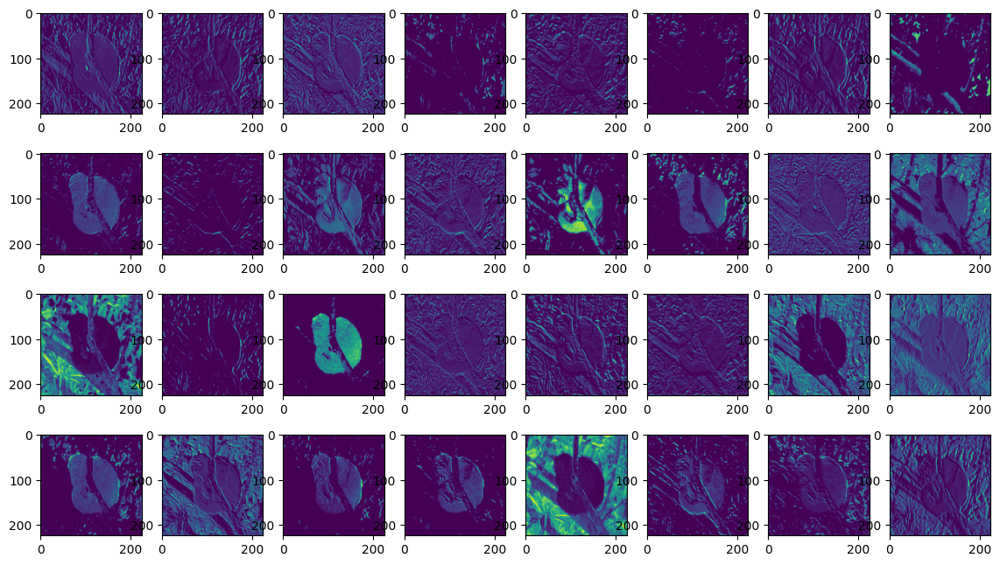

In [ ]:
vgg16.eval()

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = vgg16.forward(inputs)
        outputs_1l = vgg16.features[:2](inputs)
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs, targets, predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{trgt}], PRED: [{pred}]")
            inpt = inpt.cpu().numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(4,8, figsize=(14, 8))

            j = 0
            for axi in ax:
                for axj in axi:
                  axj.imshow(out_1l[j].cpu().detach().numpy())
                  j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
vgg16.eval()

true = torch.empty(0).to(device)
predict = torch.empty(0).to(device)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = vgg16(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))

<Axes: >

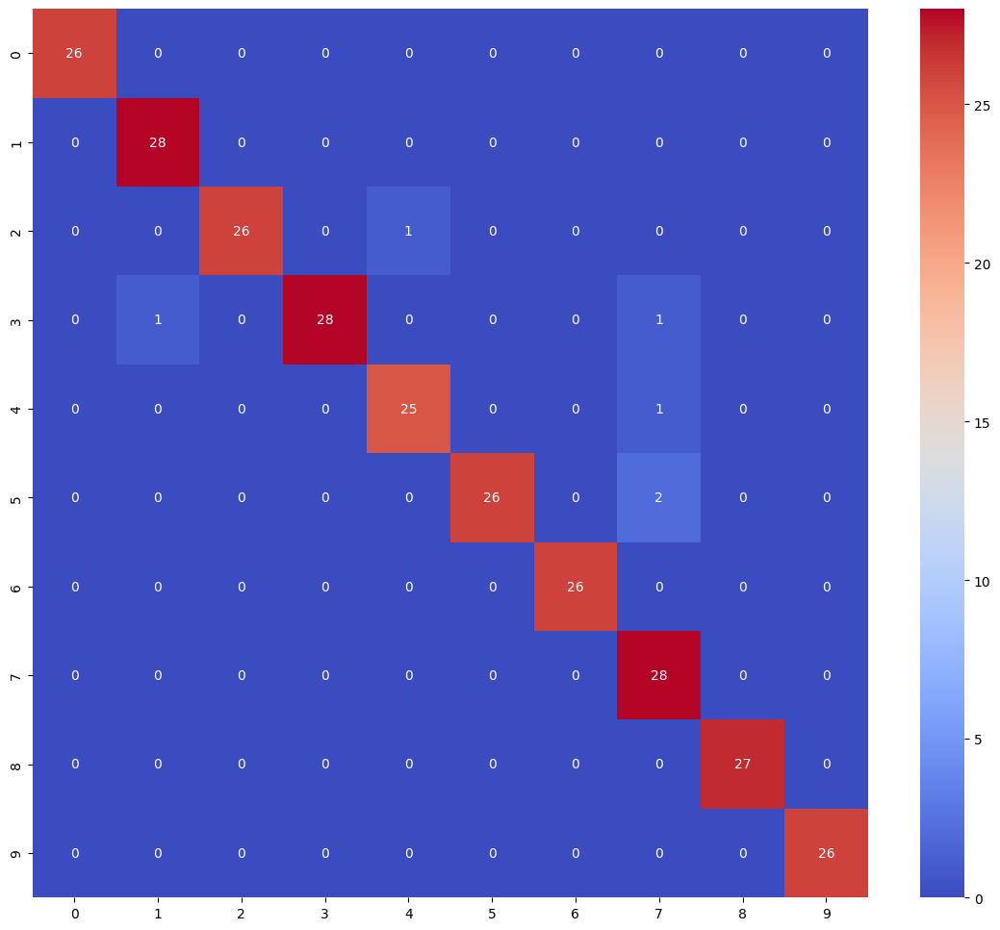

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.cpu().numpy().astype("int"), predict.cpu().numpy().astype("int")),
    ),
    annot=True,
    fmt="d",
    cmap='coolwarm'
)


In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.9779


In [ ]:
models.vgg16()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
vgg16 = models.vgg16(weights='IMAGENET1K_V1')
for param in vgg16.features.parameters():
    param.requires_grad = False
vgg16.classifier[6] = nn.Linear(4096, 10)
vgg16 = vgg16.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(vgg16.parameters(), lr=0.0001, weight_decay=1e-5)
param_num = sum(p.numel() for p in vgg16.parameters())
print("Количество параметров:", param_num)

Количество параметров: 134301514


In [ ]:
losses = []
test_losses = []
for epoch in range(5):
    total_loss, train_accuracy = train(vgg16, device, train_dl, optimizer, criterion)
    losses.append(total_loss)
    test_loss, test_accuracy = test(vgg16, device, test_dl, criterion)
    test_losses.append(test_loss)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}], Test_loss: [{test_loss:.4f}]")
    if test_accuracy >=0.99:
        break

epoch [1]: Loss: [15.1715], Train_acc: [0.7366], Test_acc: [0.9743], Test_loss: [0.5421]
epoch [2]: Loss: [0.6422], Train_acc: [0.9872], Test_acc: [0.9816], Test_loss: [0.2747]
epoch [3]: Loss: [0.2263], Train_acc: [0.9936], Test_acc: [0.9779], Test_loss: [0.4115]
epoch [4]: Loss: [0.0872], Train_acc: [0.9982], Test_acc: [0.9816], Test_loss: [0.2860]
epoch [5]: Loss: [0.0603], Train_acc: [0.9982], Test_acc: [0.9890], Test_loss: [0.2557]


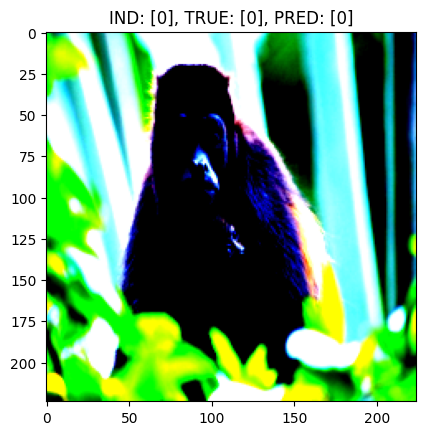

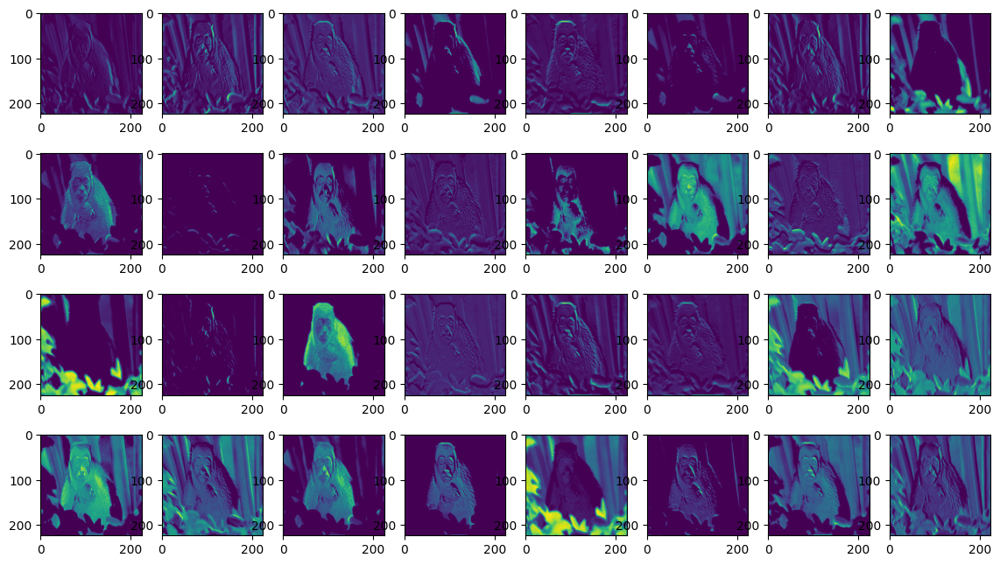

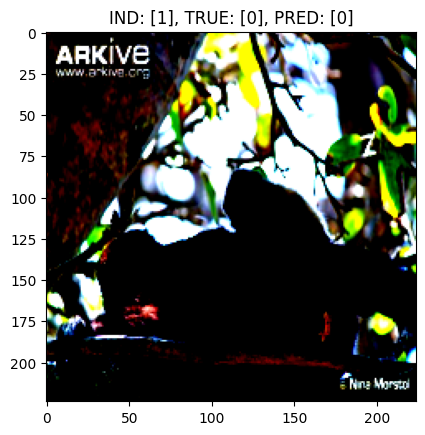

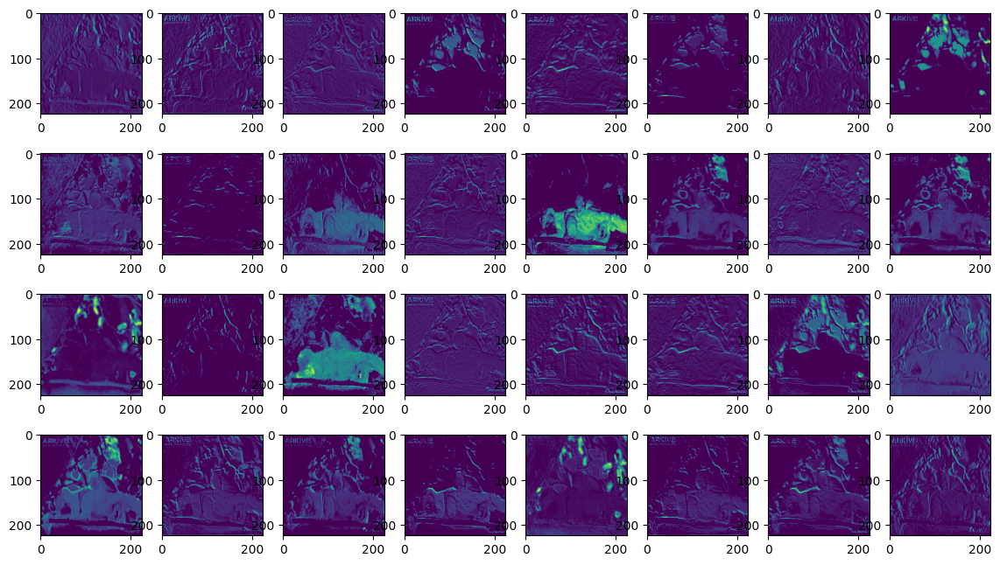

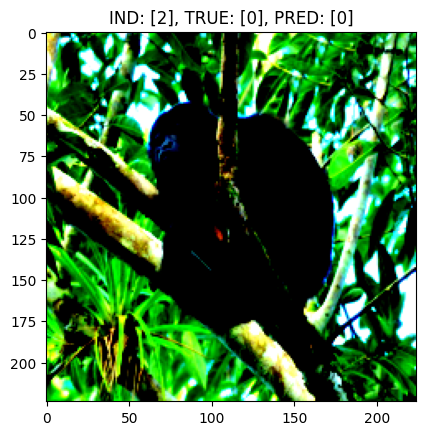

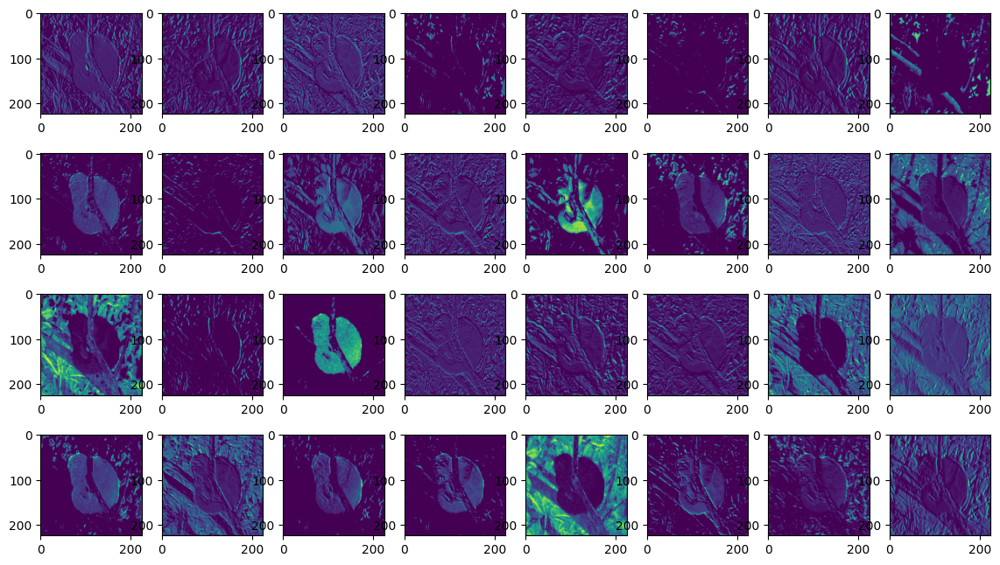

In [ ]:
vgg16.eval()

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = vgg16.forward(inputs)
        outputs_1l = vgg16.features[:2](inputs)
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs, targets, predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{trgt}], PRED: [{pred}]")
            inpt = inpt.cpu().numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(4,8, figsize=(14, 8))

            j = 0
            for axi in ax:
                for axj in axi:
                    axj.imshow(out_1l[j].cpu().detach().numpy())
                    j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
vgg16.eval()

true = torch.empty(0).to(device)
predict = torch.empty(0).to(device)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = vgg16(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))

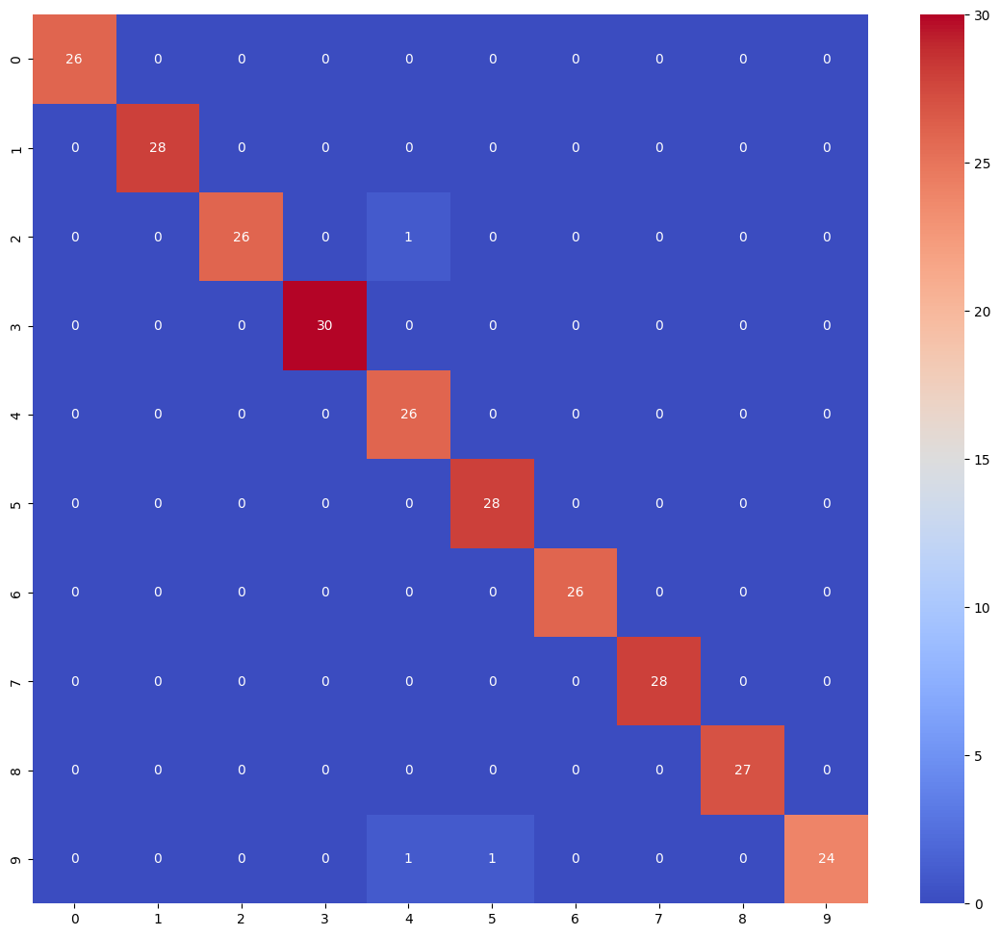

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.cpu().numpy().astype("int"), predict.cpu().numpy().astype("int")),
    ),
    annot=True,
    fmt="d",
    cmap='coolwarm'
);

In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.9890


In [ ]:
torch.save(vgg16.state_dict(), 'model_4_1_vgg16.pth')

### 4.2 Решить задачу 3.2, воспользовавшись подходящей предобученной моделью
* Не использовать VGG16 (вместо нее можно взять resnet18 или другую)
* Загрузить данные для обучения
* Преобразования: размер 224x224, нормализация с параметрами `mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)`
* Заменить последний полносвязный слой модели в соответствии с задачей
* Дообучить модель.
* Вычислить значение accuracy на тестовом множестве (добиться значения не меньше 97-98%)

In [ ]:
dataset =  datasets.ImageFolder(
    './data/cats_dogs/train',
    transform=transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ])
)
trainx, testx = torch.utils.data.random_split(dataset, [0.8, 0.2])

train_dl = torch.utils.data.DataLoader(
    dataset=trainx,
    batch_size=64, shuffle=True)
test_dl = torch.utils.data.DataLoader(
    dataset=testx,
    batch_size=64, shuffle=False)

In [ ]:
resnet18 = models.resnet18(weights='IMAGENET1K_V1')
resnet18.fc = nn.Linear(512, 2)

for param in resnet18.parameters():
    param.requires_grad = False
for param in resnet18.fc.parameters():
    param.requires_grad = True

resnet18 = resnet18.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet18.fc.parameters(), lr=0.0001, weight_decay=1e-5 )
param_num = sum(p.numel() for p in resnet18.parameters())
print("Количество параметров:", param_num)

Количество параметров: 11181642


In [ ]:
losses = []
test_losses = []
for epoch in range(5):
    total_loss, train_accuracy = train(resnet18, device, train_dl, optimizer, criterion)
    losses.append(total_loss)
    test_loss, test_accuracy = test(resnet18, device, test_dl, criterion)
    test_losses.append(test_loss)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}], Test_loss: [{test_loss:.4f}]")

    if test_accuracy >=0.98:
        break

epoch [1]: Loss: [72.0571], Train_acc: [0.9619], Test_acc: [0.9742]
epoch [2]: Loss: [79.6430], Train_acc: [0.9612], Test_acc: [0.9744]
epoch [3]: Loss: [71.1196], Train_acc: [0.9656], Test_acc: [0.9786]
epoch [4]: Loss: [71.9457], Train_acc: [0.9651], Test_acc: [0.9658]
epoch [5]: Loss: [69.3132], Train_acc: [0.9674], Test_acc: [0.9790]


In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


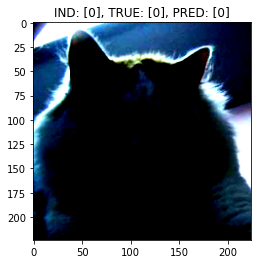

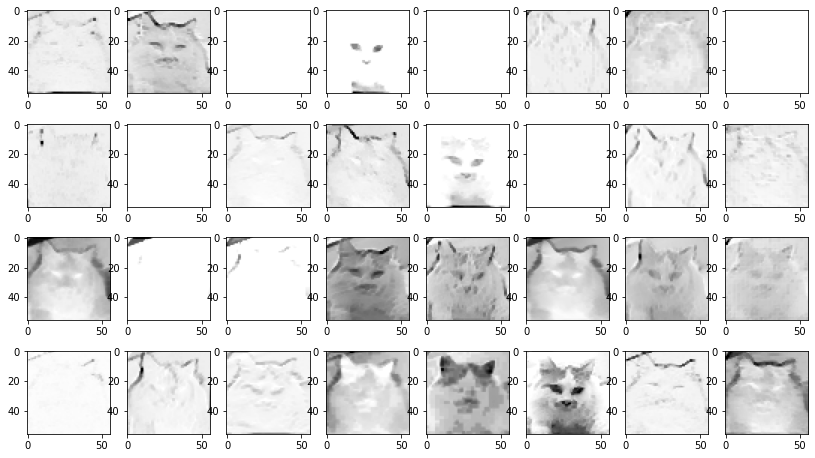

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


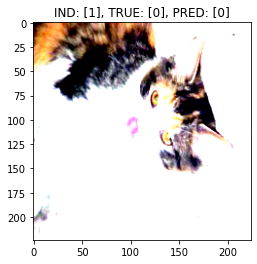

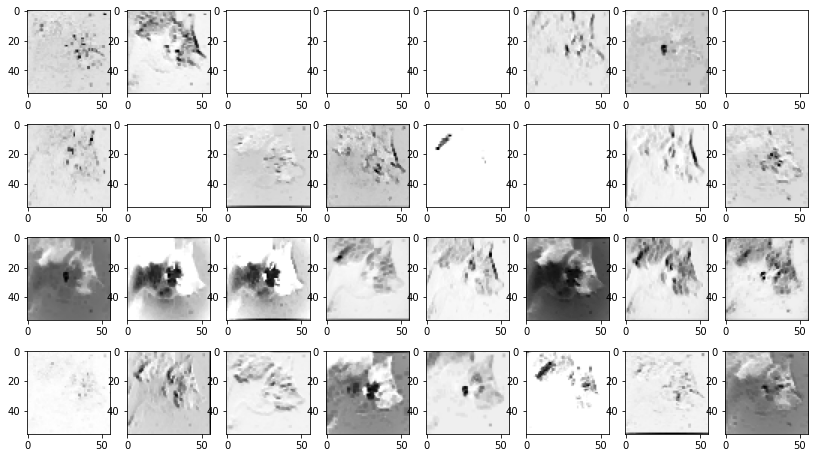

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


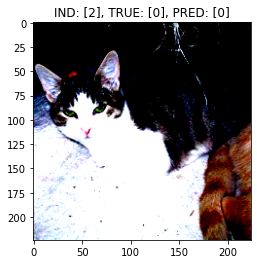

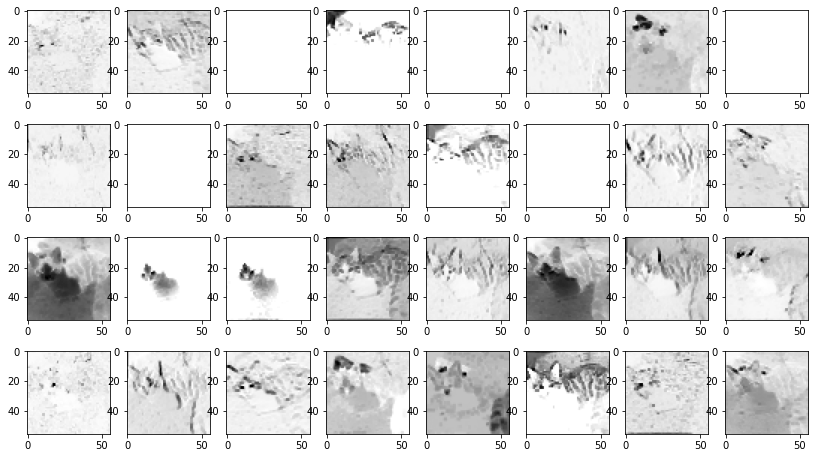

In [ ]:
resnet18.eval()

with torch.no_grad():
    first_layer = nn.Sequential(*list(resnet18.children())[:4])
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = resnet18.forward(inputs)
        outputs_1l = first_layer(inputs)
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs, targets, predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{trgt}], PRED: [{pred}]")
            inpt = inpt.cpu().numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(4,8, figsize=(14, 8))

            j = 0
            for axi in ax:
                for axj in axi:
                    axj.imshow(out_1l[j].cpu().detach().numpy())
                    j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
resnet18.eval()

true = torch.empty(0).to(device)
predict = torch.empty(0).to(device)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = resnet18(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))

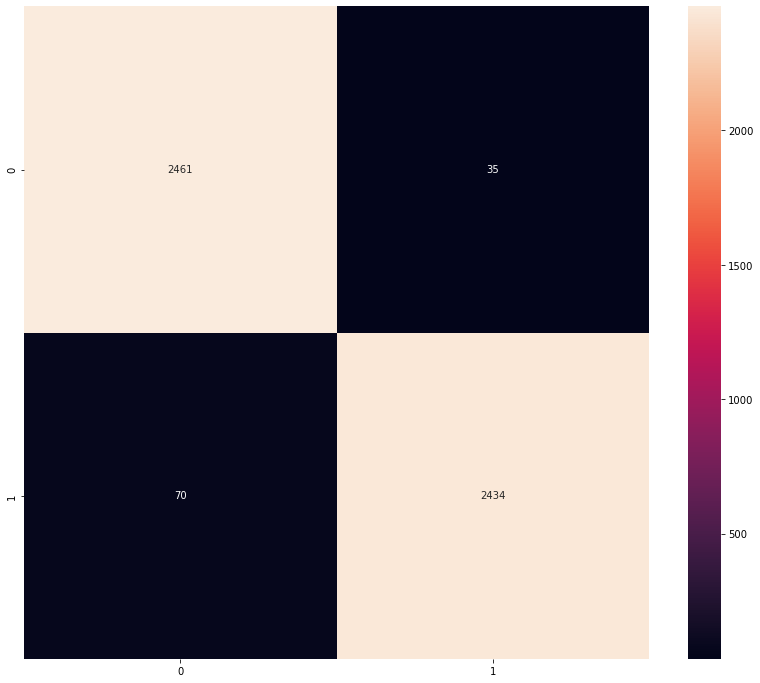

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.cpu().numpy().astype("int"), predict.cpu().numpy().astype("int")),
    ),
    annot=True,
    fmt="d",
    cmap='coolwarm'
);

In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.9790


In [ ]:
torch.save(resnet18.state_dict(), 'model_4_2_resnet18.pth')